In [1]:
import matplotlib.pyplot as plt
#plt.rcParams['font.family'] ='Malgun Gothic'
plt.rcParams['font.family'] ='NanumGothic'
plt.rcParams['axes.unicode_minus'] =False

In [2]:
import os                        
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns


In [4]:
PATH = r"/data/ephemeral/home/yjl/upstage-ml-regression-ml5/data"

train = pd.read_csv(os.path.join(PATH, "train.csv")) # (1118822, 52)
test = pd.read_csv(os.path.join(PATH, "test.csv")) # (9272, 51)
#train_test = pd.read_csv(os.path.join(PATH, "train_test.csv")) # (1128094, 53)
train_test_final = pd.read_csv(os.path.join(PATH, "train_test_final.csv")) # 컬럼 추림
train_test_seoul_apart = pd.read_csv(os.path.join(PATH, "train_test_seoul_apart.csv")) # 
#trainset = pd.read_csv(os.path.join(PATH, "trainset.csv")) # 
#reconstruction = pd.read_csv(os.path.join(PATH, "reconstruction.csv"), encoding='CP949')
subway_feature = pd.read_csv(os.path.join(PATH, "subway_feature.csv"))
sample_submission = pd.read_csv(os.path.join(PATH, "sample_submission.csv"))
bus_feature = pd.read_csv(os.path.join(PATH, "bus_feature.csv"))
seoul_apart = pd.read_csv(r"/data/ephemeral/home/yjl/upstage-ml-regression-ml5/data/seoul_apart.csv")
seoul_apart_jimi = pd.read_excel(r'/data/ephemeral/home/yjl/upstage-ml-regression-ml5/data/서울시 공동주택 관리 현황 (2023.12.31.기준)_수정본.xlsx')
#reconstruction_modified = pd.read_csv(r"/data/ephemeral/home/yjl/upstage-ml-regression-ml5/data/reconstruction_modified.csv", encoding='CP949')
# 출처: https://data.seoul.go.kr/dataList/OA-15818/S/1/datasetView.do 서울시 공동주택 아파트 정보
doroaddress = pd.read_csv(os.path.join(PATH, "doroaddress.csv")) # (8325, 7)
bunjiaddress = pd.read_csv(os.path.join(PATH, "bunjiaddress.csv")) # (8954, 1) 
# 출처: https://www.juso.go.kr/CommonPageLink.do?link=/support/AddressTransform 100만건 이하 주소전환
station_distance = pd.read_csv(os.path.join(PATH, "station_distance.csv"))
match_build_seoul = pd.read_csv(os.path.join(PATH, "match_build_seoul.csv")) # (599943, 38)
match_build_seoul_for_model = pd.read_csv(os.path.join(PATH, "match_build_seoul_for_model.csv")) # (31377, 7)
#match_build_seoul_no_duplicates =pd.read_csv(os.path.join(PATH, "match_build_seoul_no_duplicates.csv")) # (529304,3)
match_build_seoul_지번 = pd.read_csv(os.path.join(PATH, "match_build_seoul_지번.csv")) # (529367, 4)
finance = pd.read_csv(os.path.join(PATH, "finance_수정본.csv"))
trainset_0716 = pd.read_csv(r'/data/ephemeral/home/yjl/upstage-ml-regression-ml5/data_final/trainset_0716.csv')
#academy = pd.read_csv(os.path.join(PATH, "ES1001AM00101MM2306_csv.csv"), encoding='CP949', delimiter='|', quotechar='"')
academy = pd.read_csv(os.path.join(PATH, "academy.csv"))

/tmp/ipykernel_549204/612636333.py:3: DtypeWarning: Columns (16,17,36) have mixed types. Specify dtype option on import or set low_memory=False.
  train = pd.read_csv(os.path.join(PATH, "train.csv")) # (1118822, 52)
/tmp/ipykernel_549204/612636333.py:7: DtypeWarning: Columns (40) have mixed types. Specify dtype option on import or set low_memory=False.
  train_test_seoul_apart = pd.read_csv(os.path.join(PATH, "train_test_seoul_apart.csv")) #
/tmp/ipykernel_549204/612636333.py:21: DtypeWarning: Columns (20,21) have mixed types. Specify dtype option on import or set low_memory=False.
  match_build_seoul = pd.read_csv(os.path.join(PATH, "match_build_seoul.csv")) # (599943, 38)
/tmp/ipykernel_549204/612636333.py:26: DtypeWarning: Columns (79) have mixed types. Specify dtype option on import or set low_memory=False.
  trainset_0716 = pd.read_csv(r'/data/ephemeral/home/yjl/upstage-ml-regression-ml5/data_final/trainset_0716.csv')


In [7]:
pd.set_option('display.max_columns',100)
pd.set_option('display.max_rows',100) 

# 셋팅

In [31]:
# train/test 구분을 위한 칼럼을 하나 만들어 줍니다.
train['is_test'] = 0
test['is_test'] = 1
train_test = pd.concat([train, test])     # 하나의 데이터로 만들어줍니다.

In [32]:
train_test['is_test'].value_counts()      # train과 test data가 하나로 합쳐진 것을 확인할 수 있습니다.

is_test
0    1118822
1       9272
Name: count, dtype: int64

In [33]:
# 본번, 부번의 경우 float로 되어있지만 범주형 변수의 의미를 가지므로 object(string) 형태로 바꾸어주고 아래 작업을 진행하겠습니다.
train_test['본번'] = train_test['본번'].astype('str')
train_test['부번'] = train_test['부번'].astype('str')

In [34]:
# 이상치 제거 이전의 shape은 아래와 같습니다.
print(train_test.shape)

(1128094, 53)


In [36]:
train_test = train_test.rename(columns={'전용면적(㎡)':'전용면적'})

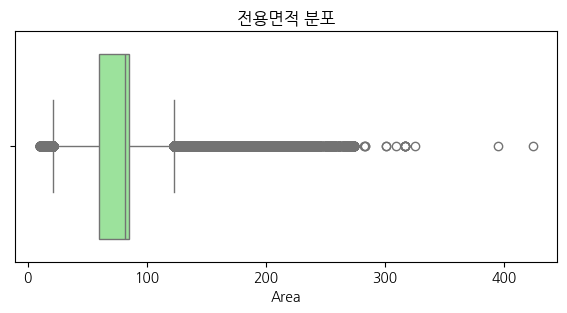

In [37]:
# 대표적인 연속형 변수인 “전용 면적” 변수 관련한 분포를 먼저 살펴보도록 하겠습니다.
fig = plt.figure(figsize=(7, 3))
sns.boxplot(data = train_test, x = '전용면적', color='lightgreen')
plt.title('전용면적 분포')
plt.xlabel('Area')
plt.show()

In [39]:
# 이상치 제거 방법에는 IQR을 이용하겠습니다.
def remove_outliers_iqr(dt, column_name):
    train = dt.query('is_test == 0')       # train data 내에 있는 이상치만 제거하도록 하겠습니다.
    test = dt.query('is_test == 1')

    Q1 = train[column_name].quantile(0.25)
    Q3 = train[column_name].quantile(0.75)
    IQR = Q3 - Q1

    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    train = train[(train[column_name] >= lower_bound) & (train[column_name] <= upper_bound)]

    result = pd.concat([train, test])   # test data와 다시 합쳐주겠습니다.
    return result

In [42]:
train_test = remove_outliers_iqr(train_test, '전용면적')

In [43]:
print(train_test.shape)

(1038846, 53)


In [44]:
train_test['is_test'].value_counts()

is_test
0    1029574
1       9272
Name: count, dtype: int64

# 변수 만들기

In [45]:
# 시군구, 년월 등 분할할 수 있는 변수들은 세부사항 고려를 용이하게 하기 위해 모두 분할해 주겠습니다.
train_test['구'] = train_test['시군구'].map(lambda x : x.split()[1])
train_test['동'] = train_test['시군구'].map(lambda x : x.split()[2])
del train_test['시군구']

train_test['계약년'] = train_test['계약년월'].astype('str').map(lambda x : x[:4])
train_test['계약월'] = train_test['계약년월'].astype('str').map(lambda x : x[4:])

In [46]:
train_test.columns

Index(['번지', '본번', '부번', '아파트명', '전용면적', '계약년월', '계약일', '층', '건축년도', '도로명',
       '해제사유발생일', '등기신청일자', '거래유형', '중개사소재지', 'k-단지분류(아파트,주상복합등등)', 'k-전화번호',
       'k-팩스번호', '단지소개기존clob', 'k-세대타입(분양형태)', 'k-관리방식', 'k-복도유형', 'k-난방방식',
       'k-전체동수', 'k-전체세대수', 'k-건설사(시공사)', 'k-시행사', 'k-사용검사일-사용승인일', 'k-연면적',
       'k-주거전용면적', 'k-관리비부과면적', 'k-전용면적별세대현황(60㎡이하)', 'k-전용면적별세대현황(60㎡~85㎡이하)',
       'k-85㎡~135㎡이하', 'k-135㎡초과', 'k-홈페이지', 'k-등록일자', 'k-수정일자', '고용보험관리번호',
       '경비비관리형태', '세대전기계약방법', '청소비관리형태', '건축면적', '주차대수', '기타/의무/임대/임의=1/2/3/4',
       '단지승인일', '사용허가여부', '관리비 업로드', '좌표X', '좌표Y', '단지신청일', 'target',
       'is_test', '구', '동', '계약년', '계약월'],
      dtype='object')

In [47]:
all = list(train_test['구'].unique())
gangnam = ['강서구', '영등포구', '동작구', '서초구', '강남구', '송파구', '강동구']
gangbuk = [x for x in all if x not in gangnam]

assert len(all) == len(gangnam) + len(gangbuk)       # 알맞게 분리되었는지 체크합니다.

In [48]:
# 강남의 여부를 체크합니다.
is_gangnam = []
for x in train_test['구'].tolist() :
  if x in gangnam :
    is_gangnam.append(1)
  else :
    is_gangnam.append(0)

# 파생변수를 하나 만릅니다.
train_test['강남여부'] = is_gangnam

In [49]:
# 건축년도 분포는 아래와 같습니다. 특히 2005년이 Q3에 해당합니다.
# 2009년 이후에 지어진 건물은 10%정도 되는 것을 확인할 수 있습니다.
train_test['건축년도'].describe(percentiles = [0.1, 0.25, 0.5, 0.75, 0.8, 0.9])

count    1.038846e+06
mean     1.998583e+03
std      9.132471e+00
min      1.961000e+03
10%      1.987000e+03
25%      1.992000e+03
50%      2.000000e+03
75%      2.005000e+03
80%      2.006000e+03
90%      2.009000e+03
max      2.023000e+03
Name: 건축년도, dtype: float64

In [50]:
# 따라서 2009년 이후에 지어졌으면 비교적 신축이라고 판단하고, 신축 여부 변수를 제작해보도록 하겠습니다.
train_test['신축여부'] = train_test['건축년도'].apply(lambda x: 1 if x >= 2009 else 0)

In [51]:
train_test.columns

Index(['번지', '본번', '부번', '아파트명', '전용면적', '계약년월', '계약일', '층', '건축년도', '도로명',
       '해제사유발생일', '등기신청일자', '거래유형', '중개사소재지', 'k-단지분류(아파트,주상복합등등)', 'k-전화번호',
       'k-팩스번호', '단지소개기존clob', 'k-세대타입(분양형태)', 'k-관리방식', 'k-복도유형', 'k-난방방식',
       'k-전체동수', 'k-전체세대수', 'k-건설사(시공사)', 'k-시행사', 'k-사용검사일-사용승인일', 'k-연면적',
       'k-주거전용면적', 'k-관리비부과면적', 'k-전용면적별세대현황(60㎡이하)', 'k-전용면적별세대현황(60㎡~85㎡이하)',
       'k-85㎡~135㎡이하', 'k-135㎡초과', 'k-홈페이지', 'k-등록일자', 'k-수정일자', '고용보험관리번호',
       '경비비관리형태', '세대전기계약방법', '청소비관리형태', '건축면적', '주차대수', '기타/의무/임대/임의=1/2/3/4',
       '단지승인일', '사용허가여부', '관리비 업로드', '좌표X', '좌표Y', '단지신청일', 'target',
       'is_test', '구', '동', '계약년', '계약월', '강남여부', '신축여부'],
      dtype='object')

In [54]:
train_test.head(1)

,번지,본번,부번,아파트명,전용면적,계약년월,계약일,층,건축년도,도로명,...,단지신청일,target,is_test,구,동,계약년,계약월,강남여부,신축여부,도로명주소
0,658-1,658.0,1.0,개포6차우성,79.97,201712,8,3,1987,언주로 3,...,2022-11-17 10:19:06.0,124000.0,0,강남구,개포동,2017,12,1,0,서울특별시 강남구 언주로 3


In [53]:
train_test['도로명주소'] = '서울특별시' +' ' + train_test['구']+ ' '+train_test['도로명']

# train_test : 도로명주소, 지번주소 연결

In [24]:
addr_up_ej = pd.read_csv(r'/data/ephemeral/home/yjl/upstage-ml-regression-ml5/data/addr_up_ej.csv')

In [56]:
addr_up_ej = addr_up_ej[['번지주소_ej','도로명_ej']]

In [57]:
addr_up_ej.columns = ['지번주소','도로명주소']

In [58]:
train_test.columns

Index(['번지', '본번', '부번', '아파트명', '전용면적', '계약년월', '계약일', '층', '건축년도', '도로명',
       '해제사유발생일', '등기신청일자', '거래유형', '중개사소재지', 'k-단지분류(아파트,주상복합등등)', 'k-전화번호',
       'k-팩스번호', '단지소개기존clob', 'k-세대타입(분양형태)', 'k-관리방식', 'k-복도유형', 'k-난방방식',
       'k-전체동수', 'k-전체세대수', 'k-건설사(시공사)', 'k-시행사', 'k-사용검사일-사용승인일', 'k-연면적',
       'k-주거전용면적', 'k-관리비부과면적', 'k-전용면적별세대현황(60㎡이하)', 'k-전용면적별세대현황(60㎡~85㎡이하)',
       'k-85㎡~135㎡이하', 'k-135㎡초과', 'k-홈페이지', 'k-등록일자', 'k-수정일자', '고용보험관리번호',
       '경비비관리형태', '세대전기계약방법', '청소비관리형태', '건축면적', '주차대수', '기타/의무/임대/임의=1/2/3/4',
       '단지승인일', '사용허가여부', '관리비 업로드', '좌표X', '좌표Y', '단지신청일', 'target',
       'is_test', '구', '동', '계약년', '계약월', '강남여부', '신축여부', '도로명주소'],
      dtype='object')

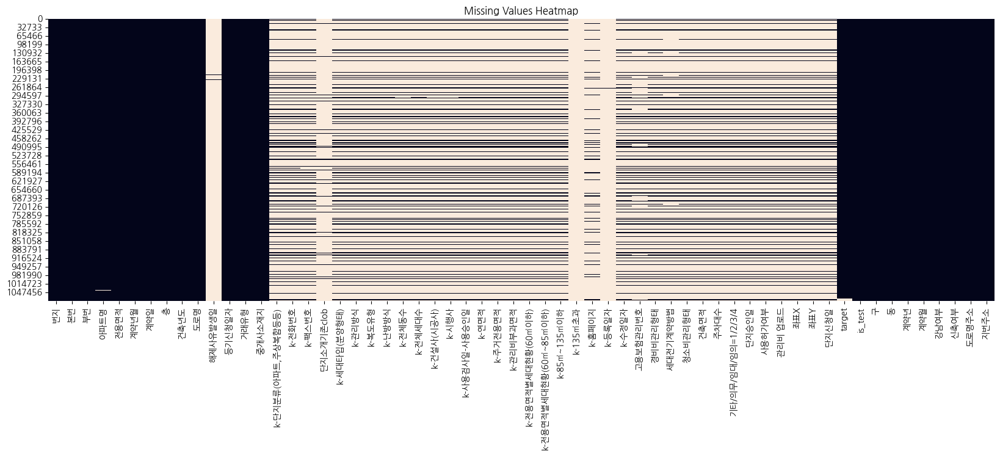

In [61]:
import seaborn as sns
import matplotlib.pyplot as plt

# 결측치 히트맵 생성
plt.figure(figsize=(20, 6))  # 가로 16인치, 세로 6인치로 설정
sns.heatmap(df.isnull(), cbar=False)
plt.title("Missing Values Heatmap")
plt.show()

In [63]:
train_test['거래유형'].unique()

array(['-', '중개거래', '직거래'], dtype=object)

In [64]:
train_test['k-세대타입(분양형태)'].unique()

array(['분양', '기타', nan, '임대'], dtype=object)

In [65]:
train_test['기타/의무/임대/임의=1/2/3/4'].unique()

array(['임의', '의무', '기타', nan, '임대'], dtype=object)

In [67]:
new_columns =['번지', '본번', '부번', '아파트명', '전용면적', '계약년월', '계약일', '층', '건축년도', '도로명',
       'k-단지분류(아파트,주상복합등등)', 'k-전체동수', 'k-전체세대수', 'k-건설사(시공사)', 'k-연면적',
       'k-주거전용면적', 'k-관리비부과면적', 'k-전용면적별세대현황(60㎡이하)', 'k-전용면적별세대현황(60㎡~85㎡이하)',
       'k-85㎡~135㎡이하', '건축면적', '주차대수', '좌표X', '좌표Y', 'target',
       'is_test', '구', '동', '계약년', '계약월', '강남여부', '신축여부', '도로명주소']

In [69]:
train_test = train_test[new_columns]

In [347]:
train_test.shape

(1080162, 34)

In [70]:
df = pd.merge(train_test, addr_up_ej, left_on='도로명주소', right_on='도로명주소', how='left')

In [72]:
train_test = df.copy()

In [348]:
train_test.shape

(1080162, 34)

# seoul_apart 연결

In [74]:
seoul_apart.head(1)

,번호,k-아파트코드,k-아파트명,"k-단지분류(아파트,주상복합등등)",kapt도로명주소,주소(시군구),주소(읍면동),주소(도로명),k-전체동수,k-전체세대수,...,k-연면적,k-주거전용면적,k-관리비부과면적,k-전용면적별세대현황(60㎡이하),k-전용면적별세대현황(60㎡~85㎡이하),k-85㎡~135㎡이하,k-135㎡초과,주차대수,좌표X,좌표Y
0,1,A15679103,우리유앤미,아파트,서울특별시 동작구 서달로 83,동작구,흑석동,서달로,2,206,...,27097.0,15827.0,20098.0,89.0,93.0,24.0,NaN,223.0,126.9596386,37.500668


In [349]:
df = pd.merge(train_test, seoul_apart, left_on='도로명주소', right_on='kapt도로명주소', how='left')

In [350]:
df.shape

(1160793, 56)

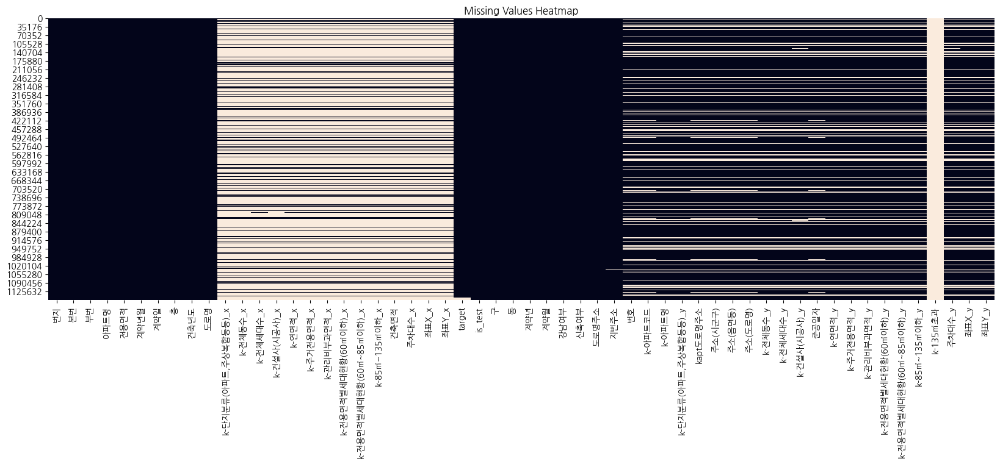

In [87]:
import seaborn as sns
import matplotlib.pyplot as plt

# 결측치 히트맵 생성
plt.figure(figsize=(20, 6))  # 가로 16인치, 세로 6인치로 설정
sns.heatmap(df.isnull(), cbar=False)
plt.title("Missing Values Heatmap")
plt.show()

In [81]:
df.to_csv(r'/data/ephemeral/home/yjl/upstage-ml-regression-ml5/data2/train_test_seoul_apart.csv')

In [85]:
# 조건에 맞는 행을 필터링하여 업데이트
mask = (df['k-아파트코드'].isna()) & (~df['k-전체동수_x'].isna())

# 조건을 만족하는 행에 대해 업데이트
df.loc[mask, 'k-아파트명'] = df.loc[mask, '아파트명']
df.loc[mask, 'k-단지분류(아파트,주상복합등등)_y'] = df.loc[mask, 'k-단지분류(아파트,주상복합등등)_x']
df.loc[mask, 'k-전체동수_y'] = df.loc[mask, 'k-전체동수_x']
df.loc[mask, 'k-전체세대수_y'] = df.loc[mask, 'k-전체세대수_x']
df.loc[mask, 'k-건설사(시공사)_y'] = df.loc[mask, 'k-건설사(시공사)_x']
df.loc[mask, 'k-연면적_y'] = df.loc[mask, 'k-연면적_x']
df.loc[mask, 'k-주거전용면적_y'] = df.loc[mask, 'k-주거전용면적_x']
df.loc[mask, 'k-관리비부과면적_y'] = df.loc[mask, 'k-관리비부과면적_x']
df.loc[mask, 'k-전용면적별세대현황(60㎡이하)_y'] = df.loc[mask, 'k-전용면적별세대현황(60㎡이하)_x']
df.loc[mask, 'k-전용면적별세대현황(60㎡~85㎡이하)_y'] = df.loc[mask, 'k-전용면적별세대현황(60㎡~85㎡이하)_x']
df.loc[mask, 'k-85㎡~135㎡이하_y'] = df.loc[mask, 'k-85㎡~135㎡이하_x']
df.loc[mask, '주차대수_y'] = df.loc[mask, '주차대수_x']
df.loc[mask, '좌표X_y'] = df.loc[mask, '좌표X_x']
df.loc[mask, '좌표Y_y'] = df.loc[mask, '좌표Y_x']


In [89]:
df.columns

Index(['번지', '본번', '부번', '아파트명', '전용면적', '계약년월', '계약일', '층', '건축년도', '도로명',
       'k-단지분류(아파트,주상복합등등)_x', 'k-전체동수_x', 'k-전체세대수_x', 'k-건설사(시공사)_x',
       'k-연면적_x', 'k-주거전용면적_x', 'k-관리비부과면적_x', 'k-전용면적별세대현황(60㎡이하)_x',
       'k-전용면적별세대현황(60㎡~85㎡이하)_x', 'k-85㎡~135㎡이하_x', '건축면적', '주차대수_x', '좌표X_x',
       '좌표Y_x', 'target', 'is_test', '구', '동', '계약년', '계약월', '강남여부', '신축여부',
       '도로명주소', '지번주소', '번호', 'k-아파트코드', 'k-아파트명', 'k-단지분류(아파트,주상복합등등)_y',
       'kapt도로명주소', '주소(시군구)', '주소(읍면동)', '주소(도로명)', 'k-전체동수_y', 'k-전체세대수_y',
       'k-건설사(시공사)_y', '준공일자', 'k-연면적_y', 'k-주거전용면적_y', 'k-관리비부과면적_y',
       'k-전용면적별세대현황(60㎡이하)_y', 'k-전용면적별세대현황(60㎡~85㎡이하)_y', 'k-85㎡~135㎡이하_y',
       'k-135㎡초과', '주차대수_y', '좌표X_y', '좌표Y_y'],
      dtype='object')

In [95]:
new_columns=['번지', '본번', '부번', '아파트명', '전용면적', '계약년월', '계약일', '층', '건축년도', '도로명',
       'target', 'is_test', '구', '동', '계약년', '계약월', '강남여부', '신축여부',
       '도로명주소', '지번주소', '번호', 'k-아파트코드', 'k-아파트명', 'k-단지분류(아파트,주상복합등등)_y',
       'kapt도로명주소', '주소(시군구)', '주소(읍면동)', '주소(도로명)', 'k-전체동수_y', 'k-전체세대수_y',
       'k-건설사(시공사)_y', '준공일자', 'k-연면적_y', 'k-주거전용면적_y', 'k-관리비부과면적_y',
       'k-전용면적별세대현황(60㎡이하)_y', 'k-전용면적별세대현황(60㎡~85㎡이하)_y', 'k-85㎡~135㎡이하_y',
       '주차대수_y', '좌표X_y', '좌표Y_y']

In [96]:
df = df[new_columns]

In [98]:
new_name_columns = ['번지', '본번', '부번', '아파트명', '전용면적', '계약년월', '계약일', '층', '건축년도', '도로명',
       'target', 'is_test', '구', '동', '계약년', '계약월', '강남여부', '신축여부',
       '도로명주소', '지번주소', '번호', 'k-아파트코드', 'k-아파트명', 'k-단지분류(아파트,주상복합등등)',
       'kapt도로명주소', '주소(시군구)', '주소(읍면동)', '주소(도로명)', 'k-전체동수', 'k-전체세대수',
       'k-건설사(시공사)', '준공일자', 'k-연면적', 'k-주거전용면적', 'k-관리비부과면적',
       'k-전용면적별세대현황(60㎡이하)', 'k-전용면적별세대현황(60㎡~85㎡이하)', 'k-85㎡~135㎡이하',
       '주차대수', '좌표X', '좌표Y']

In [99]:
df.columns =new_name_columns

In [ ]:
df.head(1)

In [101]:
df.to_csv(r'/data/ephemeral/home/yjl/upstage-ml-regression-ml5/data2/train_test_seoul_apart.csv')

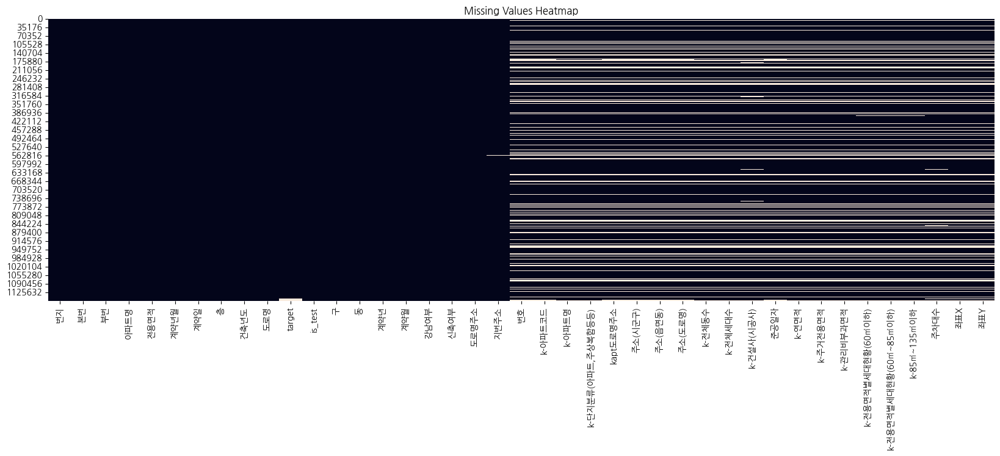

In [102]:
import seaborn as sns
import matplotlib.pyplot as plt

# 결측치 히트맵 생성
plt.figure(figsize=(20, 6))  # 가로 16인치, 세로 6인치로 설정
sns.heatmap(df.isnull(), cbar=False)
plt.title("Missing Values Heatmap")
plt.show()

# 지번주소 null값 update

In [3]:
trainset_0716 = pd.read_csv(r'/data/ephemeral/home/yjl/upstage-ml-regression-ml5/data_final/trainset_0716.csv')

/tmp/ipykernel_574040/3693781450.py:1: DtypeWarning: Columns (79) have mixed types. Specify dtype option on import or set low_memory=False.
  trainset_0716 = pd.read_csv(r'/data/ephemeral/home/yjl/upstage-ml-regression-ml5/data_final/trainset_0716.csv')


In [4]:
df = trainset_0716.copy()

In [5]:
# 조건에 맞는 행을 필터링하여 업데이트
mask = (df['아파트명']=='왕십리자이') & (df['동']=='하왕십리동')

# 조건을 만족하는 행에 대해 업데이트
df.loc[mask, '도로명주소'] = '서울특별시 성동구 하왕십리동 난계로 100'
df.loc[mask, '지번주소'] = '서울특별시 성동구 하왕십리동 1071'

In [6]:
# 조건에 맞는 행을 필터링하여 업데이트
mask = (df['아파트명']=='보문하우스토리') & (df['동']=='보문동4가')

# 조건을 만족하는 행에 대해 업데이트
df.loc[mask, '도로명주소'] = '서울특별시 성북구 고려대로2길 37'
df.loc[mask, '지번주소'] = '서울특별시 성북구 보문동4가 116'

In [7]:
# 조건에 맞는 행을 필터링하여 업데이트
mask = (df['아파트명']=='당산롯데캐슬프레스티지') & (df['동']=='당산동4가')

# 조건을 만족하는 행에 대해 업데이트
df.loc[mask, '도로명주소'] = '서울특별시 영등포구 영신로 237'
df.loc[mask, '지번주소'] = '서울특별시 영등포구 당산동4가 99'

In [8]:
# 조건에 맞는 행을 필터링하여 업데이트
mask = (df['아파트명']=='삼각') & (df['동']=='한강로1가')

# 조건을 만족하는 행에 대해 업데이트
df.loc[mask, '도로명주소'] = '서울특별시 용산구 한강대로62길 32'
df.loc[mask, '지번주소'] = '서울특별시 용산구 한강로1가 231-24'

In [9]:
# 조건에 맞는 행을 필터링하여 업데이트
mask = (df['아파트명']=='서울역센트럴자이') & (df['동']=='만리동2가')

# 조건을 만족하는 행에 대해 업데이트
df.loc[mask, '도로명주소'] = '서울특별시 중구 만리재로 175'
df.loc[mask, '지번주소'] = '서울특별시 중구 만리동2가 273'

In [10]:
# 조건에 맞는 행을 필터링하여 업데이트
mask = (df['아파트명']=='서울역한라비발디센트럴') & (df['동']=='만리동2가')

# 조건을 만족하는 행에 대해 업데이트
df.loc[mask, '도로명주소'] = '서울특별시 중구 만리재로 177'
df.loc[mask, '지번주소'] = '서울특별시 중구 만리동2가 288'

In [11]:
# 조건에 맞는 행을 필터링하여 업데이트
mask = (df['아파트명']=='개포주공1단지') & (df['동']=='개포동') # 디에이치퍼스티어아이파크 -> test 데이터셋에 없음

# 조건을 만족하는 행에 대해 업데이트
df.loc[mask, '도로명주소'] = '서울특별시 강남구 개포로 310'
df.loc[mask, '지번주소'] = '서울특별시 강남구 개포동 660-3'

In [12]:
# 조건에 맞는 행을 필터링하여 업데이트
mask = (df['아파트명']=='반포주공1단지') & (df['동']=='반포동') # 반포디에이치클래스트(2027년예정)

# 조건을 만족하는 행에 대해 업데이트
df.loc[mask, '도로명주소'] = '서울특별시 서초구 신반포로3길 18'
df.loc[mask, '지번주소'] = '서울특별시 서초구 반포동 813'

In [13]:
# 조건에 맞는 행을 필터링하여 업데이트
mask = (df['아파트명']=='에이아이디차관주택') & (df['동']=='반포동') # 없는 곳, test셋에 없음 -> 삭제하겠음

df = df[~mask]

In [14]:
mask = (df['아파트명']=='삼성') & (df['동']=='평창동') # 

# 조건을 만족하는 행에 대해 업데이트
df.loc[mask, '도로명주소'] = '서울특별시 종로구 평창문화로 172'
df.loc[mask, '지번주소'] = '서울특별시 종로구 평창동 596'

In [15]:
mask = (df['아파트명']=='현대') & (df['동']=='아현동') # 없음 삭제

df = df[~mask]

In [16]:
mask = (df['아파트명']=='삼호가든맨션') & (df['동']=='반포동') # 

# 조건을 만족하는 행에 대해 업데이트
df.loc[mask, '도로명주소'] = '서울특별시 서초구 서초중앙로 242'
df.loc[mask, '지번주소'] = '서울특별시 서초구 반포동 30-1'

In [17]:
mask = (df['아파트명']=='문화') & (df['동']=='돈암동') # 

df = df[~mask]

In [18]:
mask = (df['아파트명']=='반도1차') & (df['동']=='송파동') # 

df = df[~mask]

In [19]:
mask = (df['아파트명']=='평화') & (df['동']=='당산동3가') # 

# 조건을 만족하는 행에 대해 업데이트
df.loc[mask, '도로명주소'] = '서울특별시 영등포구 당산로31길 32'
df.loc[mask, '지번주소'] = '서울특별시 영등포구 당산동3가 559'

In [20]:
mask = (df['아파트명']=='힐스테이트신촌') & (df['동']=='북아현동') # 

# 조건을 만족하는 행에 대해 업데이트
df.loc[mask, '도로명주소'] = '서울특별시 서대문구 이화여대8길 123'
df.loc[mask, '지번주소'] = '서울특별시 서대문구 북아현동 1-954'

In [21]:
mask = (df['아파트명']=='래미안원베일리') & (df['동']=='반포동') # 

# 조건을 만족하는 행에 대해 업데이트
df.loc[mask, '도로명주소'] = '서울특별시 서초구 반포대로 333'
df.loc[mask, '지번주소'] = '서울특별시 서초구 반포동 1-1'

In [22]:
mask = (df['아파트명']=='e편한세상송파파크센트럴') & (df['동']=='거여동') # 

# 조건을 만족하는 행에 대해 업데이트
df.loc[mask, '도로명주소'] = '서울특별시 송파구 오금로 551'
df.loc[mask, '지번주소'] = '서울특별시 송파구 거여동 696'

In [23]:
mask = (df['아파트명']=='관악푸르지오102동') & (df['동']=='사당동') # 

# 조건을 만족하는 행에 대해 업데이트
df.loc[mask, '도로명주소'] = '서울특별시 관악구 관악로30길 27'
df.loc[mask, '지번주소'] = '서울특별시 관악구 봉천동 1717'

df.loc[mask, '구'] = '관악구'
df.loc[mask, '동'] = '봉천동'

In [24]:
mask = (df['아파트명']=='신촌그랑자이') & (df['동']=='대흥동') # 

# 조건을 만족하는 행에 대해 업데이트
df.loc[mask, '도로명주소'] = '서울특별시 마포구 대흥로 175'
df.loc[mask, '지번주소'] = '서울특별시 마포구 대흥동 806'

In [25]:
mask = (df['아파트명']=='동관아트빌') & (df['동']=='안암동3가') # 

# 조건을 만족하는 행에 대해 업데이트
df.loc[mask, '도로명주소'] = '서울특별시 성북구 고려대로12길 38'
df.loc[mask, '지번주소'] = '서울특별시 성북구 안암동3가 42-1'

In [26]:
mask = (df['아파트명']=='래미안라클래시') & (df['동']=='삼성동') # 

# 조건을 만족하는 행에 대해 업데이트
df.loc[mask, '도로명주소'] = '서울특별시 강남구 삼성로 651'
df.loc[mask, '지번주소'] = '서울특별시 강남구 삼성동 19-4'

In [27]:
mask = (df['아파트명']=='관악푸르지오102동') & (df['동']=='봉천동') # 

# 조건을 만족하는 행에 대해 업데이트
df.loc[mask, '도로명주소'] = '서울특별시 관악구 관악로30길 27'
df.loc[mask, '지번주소'] = '서울특별시 관악구 봉천동 1717'

In [28]:
mask = (df['아파트명']=='래미안길음센터피스') & (df['동']=='길음동') # 

# 조건을 만족하는 행에 대해 업데이트
df.loc[mask, '도로명주소'] = '서울특별시 성북구 숭인로 50'
df.loc[mask, '지번주소'] = '서울특별시 성북구 길음동 1288'

In [29]:
mask = (df['아파트명']=='안암동삼성래미안') & (df['동']=='안암동1가') # 

# 조건을 만족하는 행에 대해 업데이트
df.loc[mask, '도로명주소'] = '서울특별시 성북구 고려대로17가길 64'
df.loc[mask, '지번주소'] = '서울특별시 성북구 안암동1가 361'

In [30]:
mask = (df['아파트명']=='래미안포레카운티') & (df['동']=='장위동') # 

# 조건을 만족하는 행에 대해 업데이트
df.loc[mask, '도로명주소'] = '서울특별시 성북구 장월로 160'
df.loc[mask, '지번주소'] = '서울특별시 성북구 장위동 322'

In [31]:
mask = (df['아파트명']=='잠실올림픽공원아이파크') & (df['동']=='풍납동') # 

# 조건을 만족하는 행에 대해 업데이트
df.loc[mask, '도로명주소'] = '서울특별시 송파구 올림픽로43길 34'
df.loc[mask, '지번주소'] = '서울특별시 송파구 풍납동 514'

In [32]:
mask = (df['아파트명']=='북한산두산위브') & (df['동']=='홍은동') # 

# 조건을 만족하는 행에 대해 업데이트
df.loc[mask, '도로명주소'] = '서울특별시 서대문구 홍은중앙로3길 9'
df.loc[mask, '지번주소'] = '서울특별시 서대문구 홍은동 467'

In [33]:
mask = (df['아파트명']=='DMC롯데캐슬더퍼스트') & (df['동']=='수색동') # 

# 조건을 만족하는 행에 대해 업데이트
df.loc[mask, '도로명주소'] = '서울특별시 은평구 수색로 300'
df.loc[mask, '지번주소'] = '서울특별시 은평구 수색동 417'

In [34]:
mask = (df['아파트명']=='래미안파크스위트') & (df['동']=='구의동') # 

# 조건을 만족하는 행에 대해 업데이트
df.loc[mask, '도로명주소'] = '서울특별시 광진구 광나루로 545'
df.loc[mask, '지번주소'] = '서울특별시 광진구 구의동 668'

In [35]:
mask = (df['아파트명']=='동아쉐르빌') & (df['동']=='안암동3가') # 

# 조건을 만족하는 행에 대해 업데이트
df.loc[mask, '도로명주소'] = '서울특별시 동대문구 천호대로89길 52'
df.loc[mask, '지번주소'] = '서울특별시 동대문구 장안동 444-6'

In [36]:
mask = (df['아파트명']=='목동롯데캐슬마에스트로') & (df['동']=='목동') # 

# 조건을 만족하는 행에 대해 업데이트
df.loc[mask, '도로명주소'] = '서울특별시 양천구 목동중앙북로8길 71'
df.loc[mask, '지번주소'] = '서울특별시 양천구 목동 965'

In [37]:
mask = (df['아파트명']=='쌍용대치') & (df['동']=='대치동') # 

# 조건을 만족하는 행에 대해 업데이트
df.loc[mask, '도로명주소'] = '서울특별시 강남구 영동대로 210'
df.loc[mask, '지번주소'] = '서울특별시 강남구 대치동 66'

In [38]:
mask = (df['아파트명']=='강남엘에이치1단지') & (df['동']=='세곡동') # 

# 조건을 만족하는 행에 대해 업데이트
df.loc[mask, '도로명주소'] = '서울특별시 강남구 헌릉로571길 20'
df.loc[mask, '지번주소'] = '서울특별시 강남구 세곡동 579'

In [39]:
mask = (df['아파트명']=='강남한신휴플러스6단지') & (df['동']=='율현동') # 

# 조건을 만족하는 행에 대해 업데이트
df.loc[mask, '도로명주소'] = '서울특별시 강남구 밤고개로26길 50'
df.loc[mask, '지번주소'] = '서울특별시 강남구 율현동 365'

In [40]:
mask = (df['아파트명']=='강남한신휴플러스8단지') & (df['동']=='율현동') # 

# 조건을 만족하는 행에 대해 업데이트
df.loc[mask, '도로명주소'] = '서울특별시 강남구 밤고개로27길 20'
df.loc[mask, '지번주소'] = '서울특별시 강남구 율현동 513'

In [41]:
mask = (df['아파트명']=='강남한양수자인') & (df['동']=='자곡동') # 

# 조건을 만족하는 행에 대해 업데이트
df.loc[mask, '도로명주소'] = '서울특별시 강남구 자곡로 260'
df.loc[mask, '지번주소'] = '서울특별시 강남구 자곡동 686'

In [42]:
mask = (df['아파트명']=='래미안힐스테이트고덕') & (df['동']=='고덕동') # 

# 조건을 만족하는 행에 대해 업데이트
df.loc[mask, '도로명주소'] = '서울특별시 강동구 아리수로50길 50'
df.loc[mask, '지번주소'] = '서울특별시 강동구 고덕동 690'

In [43]:
mask = (df['아파트명']=='관악동부센트레빌') & (df['동']=='봉천동') # 

# 조건을 만족하는 행에 대해 업데이트
df.loc[mask, '도로명주소'] = '서울특별시 관악구 은천로33길 5'
df.loc[mask, '지번주소'] = '서울특별시 관악구 봉천동 1719'

In [44]:
mask = (df['아파트명']=='옥인시민') & (df['동']=='옥인동') # 

df = df[~mask]

In [45]:
mask = (df['아파트명']=='다청림라인씨티') & (df['동']=='남현동') # 

# 조건을 만족하는 행에 대해 업데이트
df.loc[mask, '도로명주소'] = '서울특별시 관악구 승방4길 20'
df.loc[mask, '지번주소'] = '서울특별시 관악구 남현동 602-17'

In [46]:
mask = (df['아파트명']=='현대3') & (df['동']=='광장동') # 

# 조건을 만족하는 행에 대해 업데이트
df.loc[mask, '도로명주소'] = '서울특별시 광진구 아차산로70길 62'
df.loc[mask, '지번주소'] = '서울특별시 광진구 광장동 484'

In [47]:
mask = (df['아파트명']=='이좋은집') & (df['동']=='오류동') # 

# 조건을 만족하는 행에 대해 업데이트
df.loc[mask, '도로명주소'] = '서울특별시 구로구 경인로20나길 30'
df.loc[mask, '지번주소'] = '서울특별시 구로구 오류동 46-1'

In [48]:
mask = (df['아파트명']=='꿈의숲SKVIEW') & (df['동']=='월계동') # 

# 조건을 만족하는 행에 대해 업데이트
df.loc[mask, '도로명주소'] = '서울특별시 노원구 월계로42길 97'
df.loc[mask, '지번주소'] = '서울특별시 노원구 월계동 949'

In [49]:
mask = (df['아파트명']=='우성') & (df['동']=='방학동') # 

# 조건을 만족하는 행에 대해 업데이트
df.loc[mask, '도로명주소'] = '서울특별시 도봉구 해등로 307'
df.loc[mask, '지번주소'] = '서울특별시 도봉구 방학동 508'

In [50]:
mask = (df['아파트명']=='상도파크자이') & (df['동']=='상도동') # 

# 조건을 만족하는 행에 대해 업데이트
df.loc[mask, '도로명주소'] = '서울특별시 동작구 장승배기로11가길 11'
df.loc[mask, '지번주소'] = '서울특별시 동작구 상도동 900 상도파크자이'

In [51]:
mask = (df['아파트명']=='마포센트럴아이파크') & (df['동']=='아현동') # 

# 조건을 만족하는 행에 대해 업데이트
df.loc[mask, '도로명주소'] = '서울특별시 마포구 마포대로 246'
df.loc[mask, '지번주소'] = '서울특별시 마포구 아현동 802'

In [52]:
mask = (df['아파트명']=='DMC파크뷰자이1단지') & (df['동']=='남가좌동') # 

# 조건을 만족하는 행에 대해 업데이트
df.loc[mask, '도로명주소'] = '서울특별시 서대문구 가재울미래로 2'
df.loc[mask, '지번주소'] = '서울특별시 서대문구 남가좌동 385'

In [53]:
mask = (df['아파트명']=='서리풀e편한세상') & (df['동']=='방배동') # 

# 조건을 만족하는 행에 대해 업데이트
df.loc[mask, '도로명주소'] = '서울특별시 서초구 효령로33길 50'
df.loc[mask, '지번주소'] = '서울특별시 서초구 방배동 906-13'

In [54]:
mask = (df['아파트명']=='센트라스') & (df['동']=='하왕십리동') # 

# 조건을 만족하는 행에 대해 업데이트
df.loc[mask, '도로명주소'] = '서울특별시 성동구 왕십리로 410'
df.loc[mask, '지번주소'] = '서울특별시 성동구 상왕십리동 1070'

In [55]:
mask = (df['아파트명']=='옥수파크힐스101동~116동') & (df['동']=='옥수동') # 

# 조건을 만족하는 행에 대해 업데이트
df.loc[mask, '도로명주소'] = '서울특별시 성동구 매봉길 50'
df.loc[mask, '지번주소'] = '서울특별시 성동구 옥수동 528 일원'

In [56]:
mask = (df['아파트명']=='보문파크뷰자이') & (df['동']=='보문동6가') # 

# 조건을 만족하는 행에 대해 업데이트
df.loc[mask, '도로명주소'] = '서울특별시 성북구 보문사길 111'
df.loc[mask, '지번주소'] = '서울특별시 성북구 보문동6가 458'

In [57]:
mask = (df['아파트명']=='마천금호어울림1차') & (df['동']=='마천동') # 

# 조건을 만족하는 행에 대해 업데이트
df.loc[mask, '도로명주소'] = '서울특별시 송파구 성내천로 245'
df.loc[mask, '지번주소'] = '서울특별시 송파구 마천동 575'

In [58]:
mask = (df['아파트명']=='문정대우푸르지오1차') & (df['동']=='문정동') # 

# 조건을 만족하는 행에 대해 업데이트
df.loc[mask, '도로명주소'] = '서울특별시 송파구 문정로 55'
df.loc[mask, '지번주소'] = '서울특별시 송파구 문정동 18'

In [59]:
mask = (df['아파트명']=='우림') & (df['동']=='신월동') # 

# 조건을 만족하는 행에 대해 업데이트
df.loc[mask, '도로명주소'] = '서울특별시 양천구 신월로19길 7'
df.loc[mask, '지번주소'] = '서울특별시 양천구 신월동 532-148'

In [60]:
mask = (df['아파트명']=='형미그린') & (df['동']=='응암동') # 

df = df[~mask]

In [61]:
mask = (df['아파트명']=='박석고개1단지힐스테이트BL2-12') & (df['동']=='진관동') # 

# 조건을 만족하는 행에 대해 업데이트
df.loc[mask, '도로명주소'] = '서울특별시 은평구 진관1로 21-10'
df.loc[mask, '지번주소'] = '서울특별시 은평구 진관동 102'

In [62]:
df.to_csv(r'/data/ephemeral/home/yjl/upstage-ml-regression-ml5/data_final/trainset_0716_주소업데이트.csv')

In [63]:
mask = (df['아파트명']=='청운현대') & (df['동']=='청운동') # 

# 조건을 만족하는 행에 대해 업데이트
df.loc[mask, '도로명주소'] = '서울특별시 종로구 자하문로33길 43'
df.loc[mask, '지번주소'] = '서울특별시 종로구 청운동 56-45'

In [64]:
mask = (df['아파트명']=='용마금호타운') & (df['동']=='면목동') # 

# 조건을 만족하는 행에 대해 업데이트
df.loc[mask, '도로명주소'] = '서울특별시 중랑구 용마산로 348'
df.loc[mask, '지번주소'] = '서울특별시 중랑구 면목동 494'

In [65]:
mask = (df['아파트명']=='신내 데시앙포레') & (df['동']=='신내동') # 

# 조건을 만족하는 행에 대해 업데이트
df.loc[mask, '도로명주소'] = '서울특별시 중랑구 신내역로 165'
df.loc[mask, '지번주소'] = '서울특별시 중랑구 신내동 817'

In [66]:
mask = (df['아파트명']=='풍성애뜨란') & (df['동']=='등촌동') # 

# 조건을 만족하는 행에 대해 업데이트
df.loc[mask, '도로명주소'] = '서울특별시 강남구 도곡로57길 9-3'
df.loc[mask, '지번주소'] = '서울특별시 강남구 역삼동 766-10'

In [67]:
mask = (df['아파트명']=='신내우디안1단지') & (df['동']=='신내동') # 

# 조건을 만족하는 행에 대해 업데이트
df.loc[mask, '도로명주소'] = '서울특별시 중랑구 신내역로1길 85'
df.loc[mask, '지번주소'] = '서울특별시 중랑구 신내동 816'

In [68]:
mask = (df['아파트명']=='태솔에버빌') & (df['동']=='상봉동') # 

# 조건을 만족하는 행에 대해 업데이트
df.loc[mask, '도로명주소'] = '서울특별시 중랑구 망우로26길 8'
df.loc[mask, '지번주소'] = '서울특별시 중랑구 상봉동 474-10'

In [69]:
mask = (df['아파트명']=='현대') & (df['동']=='하계동') # 

# 조건을 만족하는 행에 대해 업데이트
df.loc[mask, '도로명주소'] = '서울특별시 노원구 섬밭로 232'
df.loc[mask, '지번주소'] = '서울특별시 노원구 하계동 270'

In [70]:
mask = (df['아파트명']=='진달래') & (df['동']=='도곡동') # 

# 조건을 만족하는 행에 대해 업데이트
df.loc[mask, '도로명주소'] = '서울특별시 강남구 도곡로 320'
df.loc[mask, '지번주소'] = '서울특별시 강남구 도곡동 538-3'

In [71]:
mask = (df['아파트명']=='진달래2차') & (df['동']=='역삼동') # 

# 조건을 만족하는 행에 대해 업데이트
df.loc[mask, '도로명주소'] = '서울특별시 강남구 도곡로43길 20'
df.loc[mask, '지번주소'] = '서울특별시 강남구 역삼동 763-16'

In [72]:
mask = (df['아파트명']=='삼익가든') & (df['동']=='명일동') # 

# 조건을 만족하는 행에 대해 업데이트
df.loc[mask, '도로명주소'] = '서울특별시 강동구 상암로 225'
df.loc[mask, '지번주소'] = '서울특별시 강동구 명일동 270'

In [73]:
mask = (df['아파트명']=='삼익그린2차') & (df['동']=='명일동') # 

# 조건을 만족하는 행에 대해 업데이트
df.loc[mask, '도로명주소'] = '서울특별시 강동구 고덕로 210'
df.loc[mask, '지번주소'] = '서울특별시 강동구 명일동 15'

In [74]:
mask = (df['아파트명']=='임광') & (df['동']=='상계동') # 

# 조건을 만족하는 행에 대해 업데이트
df.loc[mask, '도로명주소'] = '서울특별시 노원구 노원로 569'
df.loc[mask, '지번주소'] = '서울특별시 노원구 상계동 694'

In [75]:
mask = (df['아파트명']=='태양') & (df['동']=='답십리동') # 

# 조건을 만족하는 행에 대해 업데이트
df.loc[mask, '도로명주소'] = '서울특별시 동대문구 서울시립대로 14'
df.loc[mask, '지번주소'] = '서울특별시 동대문구 답십리동 1002'

In [76]:
mask = (df['아파트명']=='우성') & (df['동']=='도화동') # 

# 조건을 만족하는 행에 대해 업데이트
df.loc[mask, '도로명주소'] = '서울특별시 마포구 삼개로 33'
df.loc[mask, '지번주소'] = '서울특별시 마포구 도화동 83'

In [77]:
mask = (df['아파트명']=='마포지구시범6동') & (df['동']=='토정동') # 

df = df[~mask]

In [78]:
mask = (df['아파트명']=='롯데캐슬클래식') & (df['동']=='서초동') # 

# 조건을 만족하는 행에 대해 업데이트
df.loc[mask, '도로명주소'] = '서울특별시 서초구 서운로 197'
df.loc[mask, '지번주소'] = '서울특별시 서초구 서초동 1312-3'

In [79]:
mask = (df['아파트명']=='삼호1차') & (df['동']=='서초동') # 

df = df[~mask]

In [80]:
mask = (df['아파트명']=='극동그린') & (df['동']=='옥수동') # 

# 조건을 만족하는 행에 대해 업데이트
df.loc[mask, '도로명주소'] = '서울특별시 성동구 독서당로 175'
df.loc[mask, '지번주소'] = '서울특별시 성동구 옥수동 436'

In [81]:
mask = (df['아파트명']=='옥수하이츠') & (df['동']=='옥수동') # 

# 조건을 만족하는 행에 대해 업데이트
df.loc[mask, '도로명주소'] = '서울특별시 성동구 한림말길 50'
df.loc[mask, '지번주소'] = '서울특별시 성동구 옥수동 100'

In [82]:
mask = (df['아파트명']=='목동신시가지7') & (df['동']=='목동') # 

# 조건을 만족하는 행에 대해 업데이트
df.loc[mask, '도로명주소'] = '서울특별시 양천구 목동로 212'
df.loc[mask, '지번주소'] = '서울특별시 양천구 목동 925'

In [83]:
mask = (df['아파트명']=='엘지,쌍용') & (df['동']=='상봉동') # 

# 조건을 만족하는 행에 대해 업데이트
df.loc[mask, '도로명주소'] = '서울특별시 중랑구 봉화산로 130 엘지아파트'
df.loc[mask, '지번주소'] = '서울특별시 중랑구 상봉동 484'

In [84]:
mask = (df['아파트명']=='청실1') & (df['동']=='대치동') # 

# 조건을 만족하는 행에 대해 업데이트
df.loc[mask, '도로명주소'] = '서울특별시 강남구 삼성로51길 37'
df.loc[mask, '지번주소'] = '서울특별시 강남구 대치동 1027'

In [85]:
mask = (df['아파트명']=='진달래3차') & (df['동']=='역삼동') # 

# 조건을 만족하는 행에 대해 업데이트
df.loc[mask, '도로명주소'] = '서울특별시 강남구 도곡로43길 20'
df.loc[mask, '지번주소'] = '서울특별시 강남구 역삼동 763-16'

In [86]:
mask = (df['아파트명']=='금호') & (df['동']=='서초동') # 

# 조건을 만족하는 행에 대해 업데이트
df.loc[mask, '도로명주소'] = '서울특별시 서초구 명달로 10'
df.loc[mask, '지번주소'] = '서울특별시 서초구 서초동 1467-97'

In [87]:
mask = (df['아파트명']=='신용산빌딩') & (df['동']=='한강로2가') # 

df = df[~mask]

In [88]:
df.to_csv(r'/data/ephemeral/home/yjl/upstage-ml-regression-ml5/data_final/trainset_0716_주소업데이트.csv')

In [319]:
df[df['지번주소'].isna()] # 2240 row --> 0

,번지,본번,부번,아파트명,전용면적,계약년월,계약일,층,건축년도,도로명,target,is_test,구,동,계약년,계약월,강남여부,신축여부,도로명주소,지번주소,번호,k-아파트코드,k-아파트명,"k-단지분류(아파트,주상복합등등)",kapt도로명주소,주소(시군구),주소(읍면동),주소(도로명),k-전체동수,k-전체세대수,k-건설사(시공사),준공일자,k-연면적,k-주거전용면적,k-관리비부과면적,k-전용면적별세대현황(60㎡이하),k-전용면적별세대현황(60㎡~85㎡이하),k-85㎡~135㎡이하,주차대수,좌표X,좌표Y


In [320]:
df.to_csv(r'/data/ephemeral/home/yjl/upstage-ml-regression-ml5/data2/train_test_seoul_apart.csv')

# 다시 seoul_apart 연결해보기

In [322]:
seoul_apart.columns

Index(['번호', 'k-아파트코드', 'k-아파트명', 'k-단지분류(아파트,주상복합등등)', 'kapt도로명주소', '주소(시군구)',
       '주소(읍면동)', '주소(도로명)', 'k-전체동수', 'k-전체세대수', 'k-건설사(시공사)', '준공일자',
       'k-연면적', 'k-주거전용면적', 'k-관리비부과면적', 'k-전용면적별세대현황(60㎡이하)',
       'k-전용면적별세대현황(60㎡~85㎡이하)', 'k-85㎡~135㎡이하', 'k-135㎡초과', '주차대수', '좌표X',
       '좌표Y'],
      dtype='object')

In [323]:
df = pd.merge(df, seoul_apart, left_on='도로명주소', right_on='kapt도로명주소', how='left')

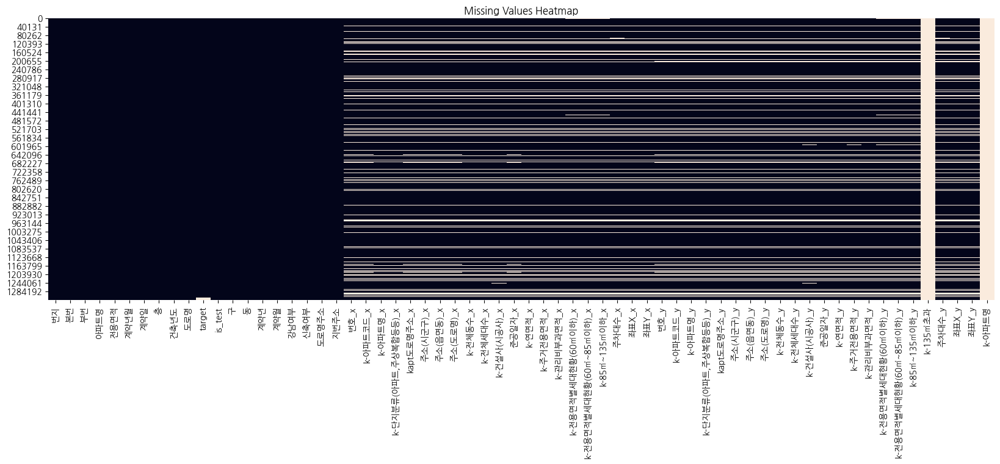

In [326]:
import seaborn as sns
import matplotlib.pyplot as plt

# 결측치 히트맵 생성
plt.figure(figsize=(20, 6))  # 가로 16인치, 세로 6인치로 설정
sns.heatmap(df.isnull(), cbar=False)
plt.title("Missing Values Heatmap")
plt.show()

In [327]:
# 조건에 맞는 행을 필터링하여 업데이트
mask = (df['k-아파트코드_x'].isna()) & (~df['k-아파트코드_y'].isna())

# 조건을 만족하는 행에 대해 업데이트
df.loc[mask, 'k-아파트명_y'] = df.loc[mask, 'k-아파트명_x']
df.loc[mask, 'k-단지분류(아파트,주상복합등등)_y'] = df.loc[mask, 'k-단지분류(아파트,주상복합등등)_x']
df.loc[mask, 'k-전체동수_y'] = df.loc[mask, 'k-전체동수_x']
df.loc[mask, 'k-전체세대수_y'] = df.loc[mask, 'k-전체세대수_x']
df.loc[mask, 'k-건설사(시공사)_y'] = df.loc[mask, 'k-건설사(시공사)_x']
df.loc[mask, 'k-연면적_y'] = df.loc[mask, 'k-연면적_x']
df.loc[mask, 'k-주거전용면적_y'] = df.loc[mask, 'k-주거전용면적_x']
df.loc[mask, 'k-관리비부과면적_y'] = df.loc[mask, 'k-관리비부과면적_x']
df.loc[mask, 'k-전용면적별세대현황(60㎡이하)_y'] = df.loc[mask, 'k-전용면적별세대현황(60㎡이하)_x']
df.loc[mask, 'k-전용면적별세대현황(60㎡~85㎡이하)_y'] = df.loc[mask, 'k-전용면적별세대현황(60㎡~85㎡이하)_x']
df.loc[mask, 'k-85㎡~135㎡이하_y'] = df.loc[mask, 'k-85㎡~135㎡이하_x']
df.loc[mask, '주차대수_y'] = df.loc[mask, '주차대수_x']
df.loc[mask, '좌표X_y'] = df.loc[mask, '좌표X_x']
df.loc[mask, '좌표Y_y'] = df.loc[mask, '좌표Y_x']


In [328]:
df.columns

Index(['번지', '본번', '부번', '아파트명', '전용면적', '계약년월', '계약일', '층', '건축년도', '도로명',
       'target', 'is_test', '구', '동', '계약년', '계약월', '강남여부', '신축여부', '도로명주소',
       '지번주소', '번호_x', 'k-아파트코드_x', 'k-아파트명_x', 'k-단지분류(아파트,주상복합등등)_x',
       'kapt도로명주소_x', '주소(시군구)_x', '주소(읍면동)_x', '주소(도로명)_x', 'k-전체동수_x',
       'k-전체세대수_x', 'k-건설사(시공사)_x', '준공일자_x', 'k-연면적_x', 'k-주거전용면적_x',
       'k-관리비부과면적_x', 'k-전용면적별세대현황(60㎡이하)_x', 'k-전용면적별세대현황(60㎡~85㎡이하)_x',
       'k-85㎡~135㎡이하_x', '주차대수_x', '좌표X_x', '좌표Y_x', '번호_y', 'k-아파트코드_y',
       'k-아파트명_y', 'k-단지분류(아파트,주상복합등등)_y', 'kapt도로명주소_y', '주소(시군구)_y',
       '주소(읍면동)_y', '주소(도로명)_y', 'k-전체동수_y', 'k-전체세대수_y', 'k-건설사(시공사)_y',
       '준공일자_y', 'k-연면적_y', 'k-주거전용면적_y', 'k-관리비부과면적_y',
       'k-전용면적별세대현황(60㎡이하)_y', 'k-전용면적별세대현황(60㎡~85㎡이하)_y', 'k-85㎡~135㎡이하_y',
       'k-135㎡초과', '주차대수_y', '좌표X_y', '좌표Y_y', 'k-아파트명'],
      dtype='object')

In [331]:
new_columns =['번지', '본번', '부번', '아파트명', '전용면적', '계약년월', '계약일', '층', '건축년도', '도로명',
       'target', 'is_test', '구', '동', '계약년', '계약월', '강남여부', '신축여부', '도로명주소',
       '지번주소', 'k-아파트명_y', 'k-단지분류(아파트,주상복합등등)_y', 'k-전체동수_y', 'k-전체세대수_y', 'k-건설사(시공사)_y',
       '준공일자_y', 'k-연면적_y', 'k-주거전용면적_y', 'k-관리비부과면적_y',
       'k-전용면적별세대현황(60㎡이하)_y', 'k-전용면적별세대현황(60㎡~85㎡이하)_y', 'k-85㎡~135㎡이하_y',
       '주차대수_y', '좌표X_y', '좌표Y_y'] 

In [333]:
df = df[new_columns]

In [334]:
new_name_columns = ['번지', '본번', '부번', '아파트명', '전용면적', '계약년월', '계약일', '층', '건축년도', '도로명',
       'target', 'is_test', '구', '동', '계약년', '계약월', '강남여부', '신축여부', '도로명주소',
       '지번주소', 'k-아파트명', 'k-단지분류(아파트,주상복합등등)', 'k-전체동수', 'k-전체세대수', 'k-건설사(시공사)',
       '준공일자', 'k-연면적', 'k-주거전용면적', 'k-관리비부과면적',
       'k-전용면적별세대현황(60㎡이하)', 'k-전용면적별세대현황(60㎡~85㎡이하)', 'k-85㎡~135㎡이하',
       '주차대수', '좌표X', '좌표Y'] 

In [335]:
df.columns = new_name_columns

In [336]:
df.to_csv(r'/data/ephemeral/home/yjl/upstage-ml-regression-ml5/data2/train_test_seoul_apart.csv')

In [346]:
df.shape

(1324315, 35)

# train_test_seoul_apart + match_build_seoul_지번 : 

In [344]:
train_test_seoul_apart = df.copy()

In [345]:
train_test_seoul_apart.shape

(1324315, 35)

In [338]:
match_build_seoul_지번.shape

(529367, 5)

In [339]:
train_test_seoul_apart.columns

Index(['시군구', '번지', '본번', '부번', '아파트명', '전용면적(㎡)', '계약년월일', '계약년', '계약년월',
       '계약일', '층', '건축년도', '도로명', 'target', 'is_test', '구', '동', '도로명주소',
       '번지주소', 'k-아파트명', 'k-단지분류(아파트,주상복합등등)', 'kapt도로명주소', '주소(시군구)',
       '주소(읍면동)', '주소(도로명)', 'k-전체동수', 'k-전체세대수', 'k-건설사(시공사)', '준공일자',
       'k-연면적', 'k-주거전용면적', 'k-관리비부과면적', 'k-전용면적별세대현황(60㎡이하)',
       'k-전용면적별세대현황(60㎡~85㎡이하)', 'k-85㎡~135㎡이하', 'k-135㎡초과', '주차대수', '좌표X',
       '좌표Y'],
      dtype='object')

In [340]:
match_build_seoul_지번

,Unnamed: 0,도로명주소,출입구_x좌표_wgs84,출입구_y좌표_wgs84,지번주소
0,0,서울특별시 종로구 자하문로 94,126.970406,37.584415,NaN
1,1,서울특별시 종로구 자하문로 96,126.970423,37.584513,NaN
2,2,서울특별시 종로구 자하문로 98,126.970394,37.584697,NaN
3,3,서울특별시 종로구 자하문로 99-3,126.969878,37.584916,NaN
4,4,서울특별시 종로구 자하문로 99-4,126.969853,37.585080,NaN
...,...,...,...,...,...
529362,529362,서울특별시 강동구 가래여울길 49,127.165354,37.575175,NaN
529363,529363,서울특별시 강동구 가래여울길 52,127.164790,37.575474,NaN
529364,529364,서울특별시 강동구 가래여울길 57,127.165166,37.574902,NaN
529365,529365,서울특별시 강동구 가래여울길 59,127.165425,37.574825,NaN


In [341]:
match_build_seoul_지번.columns

Index(['Unnamed: 0', '도로명주소', '출입구_x좌표_wgs84', '출입구_y좌표_wgs84', '지번주소'], dtype='object')

In [342]:
# 중복된 조합 제거
unique_match_build_seoul = match_build_seoul_지번.drop_duplicates(subset=['도로명주소', '지번주소'])


In [343]:
unique_match_build_seoul.shape

(529322, 5)

In [125]:
df = pd.merge(train_test_seoul_apart, unique_match_build_seoul[['도로명주소', '출입구_x좌표_wgs84', '출입구_y좌표_wgs84', '지번주소']], left_on=['번지주소','도로명주소'], right_on=['지번주소','도로명주소'], how='left')

In [126]:
df.shape

(1128094, 45)

In [128]:
df.to_csv(r'/data/ephemeral/home/yjl/upstage-ml-regression-ml5/data_final/train_test_seoul_apart_wgs84.csv', index=False)

In [129]:
train_test_seoul_apart_wgs84 = pd.read_csv(r'/data/ephemeral/home/yjl/upstage-ml-regression-ml5/data_final/train_test_seoul_apart_wgs84.csv')

/tmp/ipykernel_457004/2380515590.py:1: DtypeWarning: Columns (40) have mixed types. Specify dtype option on import or set low_memory=False.
  train_test_seoul_apart_wgs84 = pd.read_csv(r'/data/ephemeral/home/yjl/upstage-ml-regression-ml5/data_final/train_test_seoul_apart_wgs84.csv')


# station_distance

In [130]:
train_test_seoul_apart_wgs84.columns

Index(['시군구', '번지', '본번', '부번', '아파트명', '전용면적(㎡)', '계약년월', '계약일', '층', '건축년도',
       '도로명', 'target', 'is_test', '번지주소', 'id', '계약년월일', '구', '동', '도로명주소',
       '계약년', '번호', 'k-아파트코드', 'k-아파트명', 'k-단지분류(아파트,주상복합등등)', 'kapt도로명주소',
       '주소(시군구)', '주소(읍면동)', '주소(도로명)', 'k-전체동수', 'k-전체세대수', 'k-건설사(시공사)',
       '준공일자', 'k-연면적', 'k-주거전용면적', 'k-관리비부과면적', 'k-전용면적별세대현황(60㎡이하)',
       'k-전용면적별세대현황(60㎡~85㎡이하)', 'k-85㎡~135㎡이하', 'k-135㎡초과', '주차대수', '좌표X',
       '좌표Y', '출입구_x좌표_wgs84', '출입구_y좌표_wgs84', '지번주소'],
      dtype='object')

In [131]:
station_distance.columns

Index(['Property_ID', 'X', 'Y', 'Nearest_Bus_Station_Distance',
       'Nearest_Bus_Station_Name', 'Nearest_Subway_Station_Distance',
       'Nearest_Subway_Station_Name'],
      dtype='object')

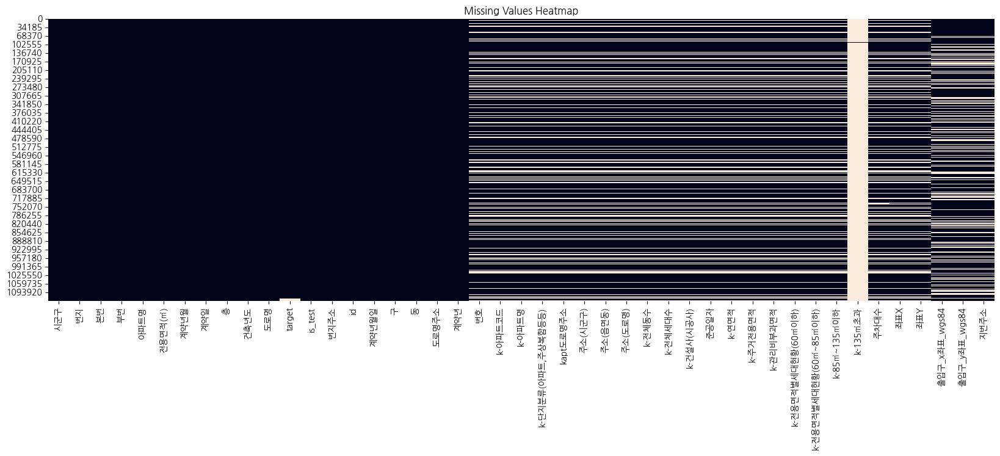

In [134]:
import seaborn as sns
import matplotlib.pyplot as plt

# 결측치 히트맵 생성
plt.figure(figsize=(20, 6))  # 가로 16인치, 세로 6인치로 설정
sns.heatmap(train_test_seoul_apart_wgs84.isnull(), cbar=False)
plt.title("Missing Values Heatmap")
plt.show()

In [ ]:
# 일단 좌표X, 좌표Y, '출입구_x좌표_wgs84', '출입구_y좌표_wgs84' 로 하나의 final_X, final_Y를 만들기

In [ ]:
# 일단 확인
train_test_seoul_apart_wgs84[train_test_seoul_apart_wgs84['도로명주소']=='서울특별시 강남구 삼성로 150']

In [160]:
# 조건에 따라 'final_X' 열 생성
train_test_seoul_apart_wgs84['final_X'] = np.where(train_test_seoul_apart_wgs84['좌표X'].isna(),
                                                    train_test_seoul_apart_wgs84['출입구_x좌표_wgs84'],
                                                    train_test_seoul_apart_wgs84['좌표X'])

In [162]:
# 조건에 따라 'final_Y' 열 생성
train_test_seoul_apart_wgs84['final_Y'] = np.where(train_test_seoul_apart_wgs84['좌표Y'].isna(),
                                                    train_test_seoul_apart_wgs84['출입구_y좌표_wgs84'],
                                                    train_test_seoul_apart_wgs84['좌표Y'])

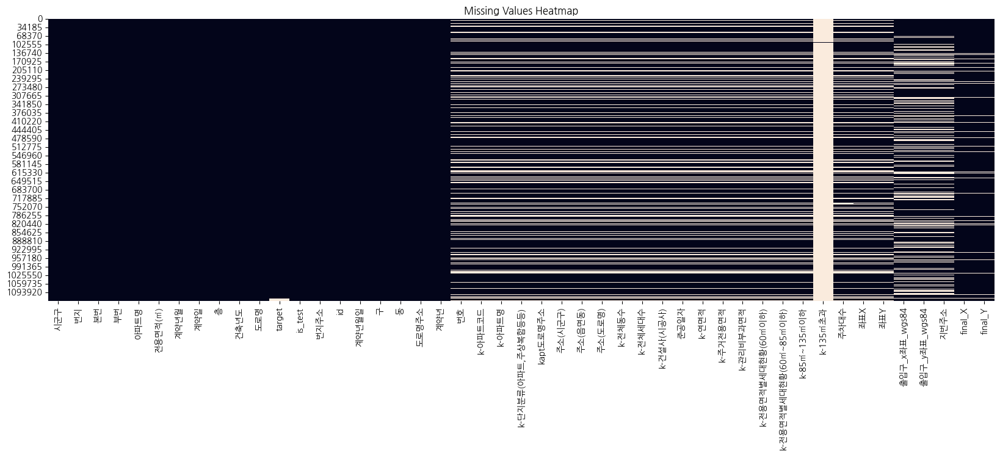

In [164]:
import seaborn as sns
import matplotlib.pyplot as plt

# 결측치 히트맵 생성
plt.figure(figsize=(20, 6))  # 가로 16인치, 세로 6인치로 설정
sns.heatmap(train_test_seoul_apart_wgs84.isnull(), cbar=False)
plt.title("Missing Values Heatmap")
plt.show()

In [ ]:
import numpy as np

# object를 numeric으로 바꿈
train_test_seoul_apart_wgs84['final_X'] = pd.to_numeric(train_test_seoul_apart_wgs84['final_X'], errors='coerce')
train_test_seoul_apart_wgs84['final_Y'] = pd.to_numeric(train_test_seoul_apart_wgs84['final_Y'], errors='coerce')

subset = train_test_seoul_apart_wgs84[['도로명주소','final_X','final_Y']].drop_duplicates() # (10567, 3)

# 버스 정류장 데이터
real_estate = pd.DataFrame({
    'Property_ID': subset.도로명주소,
    'X': subset.final_X,
    'Y': subset.final_Y,
})

Bus_stations = pd.DataFrame({
    'Bus_Station_ID': bus_feature['노드 ID'],
    'Station_Name': bus_feature.정류소명,
    'X': bus_feature.X좌표,
    'Y': bus_feature.Y좌표,
})

# 지하철 정류장 데이터
subway_stations = pd.DataFrame({
    'Subway_Station_ID': subway_feature.역사_ID,
    'Station_Name': subway_feature.역사명,
    'X': subway_feature.경도,
    'Y': subway_feature.위도,
})

def haversine_np(lon1, lat1, lon2, lat2):
    """Calculate the great circle distance between two points on the earth (specified in decimal degrees)"""
    lon1, lat1, lon2, lat2 = map(np.radians, [lon1, lat1, lon2, lat2])
    dlon = lon2 - lon1
    dlat = lat2 - lat1
    a = np.sin(dlat/2.0)**2 + np.cos(lat1) * np.cos(lat2) * np.sin(dlon/2.0)**2
    c = 2 * np.arcsin(np.sqrt(a))
    km = 6367 * c  # Multiply by Earth radius to get kilometers
    return km

# 가장 가까운 정류소 계산
def calculate_nearest_station(real_estate, stations):
    min_distances = []
    nearest_station_names = []
    for index, real in real_estate.iterrows():
        distances = haversine_np(real['X'], real['Y'], stations['X'].values, stations['Y'].values)
        min_index = distances.argmin()
        min_distances.append(distances[min_index])
        nearest_station_names.append(stations.iloc[min_index]['Station_Name'])
    return min_distances, nearest_station_names

# 버스 정류장
min_distances, nearest_station_names = calculate_nearest_station(real_estate, Bus_stations)
real_estate['Nearest_Bus_Station_Distance'] = min_distances
real_estate['Nearest_Bus_Station_Name'] = nearest_station_names

# 지하철역
min_distances, nearest_station_names = calculate_nearest_station(real_estate, subway_stations)
real_estate['Nearest_Subway_Station_Distance'] = min_distances
real_estate['Nearest_Subway_Station_Name'] = nearest_station_names

print(real_estate.head(1))


In [ ]:
real_estate

In [177]:
# 중복된 Property_ID 제거
real_estate_unique = real_estate.drop_duplicates(subset=['Property_ID'])

In [178]:
df = pd.merge(train_test_seoul_apart_wgs84, real_estate_unique, left_on=['도로명주소'], right_on=['Property_ID'], how='left')

In [179]:
df.shape

(1128094, 54)

In [176]:
train_test_seoul_apart_wgs84.shape

(1128094, 47)

In [180]:
df.to_csv(r'/data/ephemeral/home/yjl/upstage-ml-regression-ml5/data_final/train_test_seoul_apart_wgs84_station.csv')

# seoul_apart_jimi

In [140]:
seoul_apart_jimi.shape

(4011, 34)

In [183]:
train_test_seoul_apart_wgs84_station.columns

Index(['시군구', '번지', '본번', '부번', '아파트명', '전용면적(㎡)', '계약년월', '계약일', '층', '건축년도',
       '도로명', 'target', 'is_test', '번지주소', 'id', '계약년월일', '구', '동', '도로명주소',
       '계약년', '번호', 'k-아파트코드', 'k-아파트명', 'k-단지분류(아파트,주상복합등등)', 'kapt도로명주소',
       '주소(시군구)', '주소(읍면동)', '주소(도로명)', 'k-전체동수', 'k-전체세대수', 'k-건설사(시공사)',
       '준공일자', 'k-연면적', 'k-주거전용면적', 'k-관리비부과면적', 'k-전용면적별세대현황(60㎡이하)',
       'k-전용면적별세대현황(60㎡~85㎡이하)', 'k-85㎡~135㎡이하', 'k-135㎡초과', '주차대수', '좌표X',
       '좌표Y', '출입구_x좌표_wgs84', '출입구_y좌표_wgs84', '지번주소', 'final_X', 'final_Y',
       'Property_ID', 'X', 'Y', 'Nearest_Bus_Station_Distance',
       'Nearest_Bus_Station_Name', 'Nearest_Subway_Station_Distance',
       'Nearest_Subway_Station_Name'],
      dtype='object')

In [142]:
seoul_apart_jimi.columns

Index([         '입주유형',           '단지명',         '도로명주소',          '지번주소',
                  '동수',        '합계 세대수',        '분양 세대수',        '임대 세대수',
            '토지 면적(㎡)',         '합계 동수',         '5층 동수',        '5층 세대수',
            '6~10층 동수',     '6~10층 세대수',     '11~15층 동수',    '11~15층 세대수',
           '16~20층 동수',    '16~20층 세대수',      '21층이상 동수',     '21층이상 세대수',
            '~40㎡ 세대수',   '40㎡~60㎡ 세대수',   '60㎡~85㎡ 세대수',  '85㎡~102㎡ 세대수',
       '102㎡~135㎡ 세대수',     '135㎡~ 세대수',   'Unnamed: 26',   'Unnamed: 27',
         'Unnamed: 28',   'Unnamed: 29',   'Unnamed: 30',   'Unnamed: 31',
                   117,             364],
      dtype='object')

In [184]:
# 중복된 조합 제거
seoul_apart_jimi_unique = seoul_apart_jimi.drop_duplicates(subset=['지번주소', '도로명주소'])

df = pd.merge(train_test_seoul_apart_wgs84_station, seoul_apart_jimi_unique[[         '입주유형',           '단지명',         '도로명주소',          '지번주소',
                  '동수',        '합계 세대수',        '분양 세대수',        '임대 세대수',
            '토지 면적(㎡)',         '합계 동수',         '5층 동수',        '5층 세대수',
            '6~10층 동수',     '6~10층 세대수',     '11~15층 동수',    '11~15층 세대수',
           '16~20층 동수',    '16~20층 세대수',      '21층이상 동수',     '21층이상 세대수',
            '~40㎡ 세대수',   '40㎡~60㎡ 세대수',   '60㎡~85㎡ 세대수',  '85㎡~102㎡ 세대수',
       '102㎡~135㎡ 세대수',     '135㎡~ 세대수']], left_on=['번지주소','도로명주소'], right_on=['지번주소','도로명주소'], how='left')

In [185]:
df.shape

(1128094, 79)

In [186]:
train_test_seoul_apart_wgs84_station.shape

(1128094, 54)

In [187]:
df.to_csv(r'/data/ephemeral/home/yjl/upstage-ml-regression-ml5/data_final/train_test_seoul_apart_wgs84_station_jimi.csv')

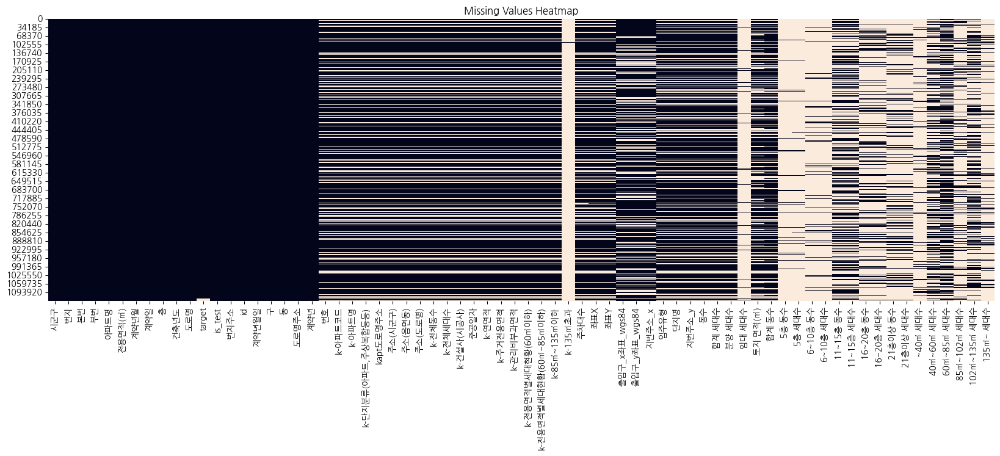

In [155]:
import seaborn as sns
import matplotlib.pyplot as plt

# 결측치 히트맵 생성
plt.figure(figsize=(20, 6))  # 가로 16인치, 세로 6인치로 설정
sns.heatmap(df.isnull(), cbar=False)
plt.title("Missing Values Heatmap")
plt.show()

# 서울특별시_부동산소비심리지수 컬럼 추가

In [189]:
import pandas as pd
import numpy as np

train_test_seoul_apart_wgs84_station_jimi['계약년월'] = train_test_seoul_apart_wgs84_station_jimi['계약년월'].astype(str)

# 제공된 지수 데이터
indices = [133.4, 136.7, 131.7, 123.6, 116.2, 108, 109.8, 115.8, 115.4, 112.5, 110.6, 99.9, 100.6, 102.3, 106.7, 109.4, 103.1, 101.4, 104.2, 111.7, 113.9, 112.1, 111.4, 109.1, 107.7, 113, 119.2, 122.5, 118, 111.7, 121.3, 127.8, 122.7, 123.3, 118.8, 111.7, 117.4, 122.4, 127.8, 128.6, 125, 114.8, 126.2, 127.1, 132.3, 134.1, 130.6, 126, 131, 130.3, 127.9, 134.7, 127.2, 112.7, 116.7, 119.5, 121.4, 125.1, 123.1, 122, 126.5, 129, 131.4, 135.9, 125.5, 111.5, 114.7, 114.5, 114.7, 115.9, 115.7, 111.6, 115.2, 110.9, 103.6, 105.6, 101.2, 94.2, 98.4, 101.4, 97.1, 93.5, 89.6, 86.9, 88.6, 91.8, 96.9, 94.1, 88.2, 87.2, 90.1, 89.6, 87.6, 81.6, 84.7, 89, 88.5, 92.6, 100.4, 101.5, 113.3, 110.4, 105.8, 105.9, 99.5, 97.5, 101.8, 112.1, 107.9, 111.1, 116.6, 132.5, 135.5, 118.3, 115.6, 115.4, 115.8, 114.7, 118.4, 121.7, 121.7, 124.2, 123.2, 116.5, 109.9, 102.2, 101.5, 102.7, 105.1, 107.9, 103.7, 97.5, 90.8, 89.1, 86.7, 76.8, 78.3, 75.7, 80.2, 88.4, 89, 93.2, 94.6, 94.4, 100.2, 99.9, 100.9]

# 날짜 범위 생성
dates = pd.date_range(start='2011-07-01', periods=len(indices), freq='M')

# 데이터프레임 생성
index_df = pd.DataFrame({'계약년월': dates, '서울특별시_부동산소비심리지수': indices})

# 계약년월을 문자열 형태로 변환 (예: 202307)
index_df['계약년월'] = index_df['계약년월'].dt.strftime('%Y%m')




# 병합 수행
train_test_seoul_apart_wgs84_station_jimi = pd.merge(train_test_seoul_apart_wgs84_station_jimi, index_df, on='계약년월', how='left')


/tmp/ipykernel_457004/813852993.py:10: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  dates = pd.date_range(start='2011-07-01', periods=len(indices), freq='M')


# finance

In [222]:
finance = pd.read_csv(r'/data/ephemeral/home/yjl/upstage-ml-regression-ml5/data/finance_수정본.csv')

In [196]:
pd.set_option('display.max_columns',100)
pd.set_option('display.max_rows',100) 

In [200]:
finance.columns

Index(['시점', '기준금리', '국고채', '회사채', '국고채-회사채', '생산자물가지수', '소비자물가지수',
       '서울특별시_가계대출', '서울특별시_주택담보대출', '서울특별시_주택매매거래량', '서울특별시_아파트매매거래량',
       '전국매매가격지수', '전국전세가격지수', '서울특별시_주택인허가실적', '서울특별시_주택착공실적', '서울특별시_주택준공실적',
       '서울특별시_주택미분양', '미분양_서울특별시'],
      dtype='object')

In [201]:
finance

,시점,기준금리,국고채,회사채,국고채-회사채,생산자물가지수,소비자물가지수,서울특별시_가계대출,서울특별시_주택담보대출,서울특별시_주택매매거래량,서울특별시_아파트매매거래량,전국매매가격지수,전국전세가격지수,서울특별시_주택인허가실적,서울특별시_주택착공실적,서울특별시_주택준공실적,서울특별시_주택미분양,미분양_서울특별시
0,200701,4.5,4.970,5.320,0.350,83.99,76.496,NaN,NaN,16826.0,6353.0,66.892,54.735,1530.0,NaN,NaN,697.0,697.0
1,200702,4.5,4.910,5.280,0.370,84.04,77.017,NaN,NaN,12029.0,4403.0,67.210,54.971,2324.0,NaN,NaN,590.0,590.0
2,200703,4.5,4.790,5.200,0.410,84.40,77.464,NaN,NaN,13487.0,5597.0,67.382,55.256,4212.0,NaN,NaN,687.0,687.0
3,200704,4.5,4.940,5.340,0.400,84.99,77.761,NaN,NaN,14349.0,5948.0,67.530,55.485,6175.0,NaN,NaN,685.0,685.0
4,200705,4.5,5.100,5.490,0.390,85.47,77.836,NaN,NaN,12552.0,4743.0,67.554,55.471,8041.0,NaN,NaN,704.0,704.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
205,202402,3.5,3.351,4.053,0.702,118.55,113.780,413811.5,257311.0,4795.0,2665.0,93.050,88.848,4952.0,1266.0,3496.0,1018.0,1018.0
206,202403,3.5,3.310,3.944,0.634,118.82,113.950,412503.1,257297.6,6098.0,3482.0,92.884,88.926,6493.0,6944.0,2362.0,968.0,968.0
207,202404,3.5,3.439,3.974,0.535,119.16,114.010,414624.4,258928.8,7898.0,4840.0,92.814,89.030,7159.0,1084.0,585.0,936.0,936.0
208,202405,3.5,3.432,3.876,0.444,119.25,114.100,NaN,NaN,8445.0,5182.0,92.790,89.203,10530.0,1531.0,4341.0,974.0,974.0


In [223]:
train_test_seoul_apart_wgs84_station_jimi['계약년월'] = train_test_seoul_apart_wgs84_station_jimi['계약년월'].astype(int)

In [224]:
df = pd.merge(train_test_seoul_apart_wgs84_station_jimi, finance, left_on='계약년월', right_on='시점', how='left')

In [225]:
df.shape

(1128094, 99)

# 미분양

In [214]:
미분양 = pd.read_csv(r'/data/ephemeral/home/yjl/upstage-ml-regression-ml5/data/미분양.csv', encoding='cp949')

In [215]:
미분양.columns

Index(['계약년월', '종로구', '중구', '성동구', '용산구', '광진구', '동대문구', '성북구', '중랑구', '노원구',
       '은평구', '서대문구', '강북구', '마포구', '도봉구', '양천구', '강서구', '구로구', '영등포구', '동작구',
       '관악구', '서초구', '강남구', '금천구', '강동구', '송파구'],
      dtype='object')

In [ ]:
import pandas as pd

# train_test_seoul_apart_wgs84_station_jimi에 '미분양수' 컬럼 추가
train_test_seoul_apart_wgs84_station_jimi['미분양_구'] = None  # 초기값 설정

# 각 행에 대해 미분양수 업데이트
for idx, row in train_test_seoul_apart_wgs84_station_jimi.iterrows():
    year_month = int(row['계약년월'])
    district = row['구']
    
    # 미분양 데이터셋에서 해당 연도와 구의 미분양 수 가져오기
    if district in 미분양.columns[1:]:
        unsold_count = 미분양.loc[미분양['계약년월']==year_month, district]
        
        if not unsold_count.empty:
            print(f"{unsold_count.iloc[0]}")
            train_test_seoul_apart_wgs84_station_jimi.at[idx, '미분양_구'] = unsold_count.iloc[0]
        else:
            print(f"No data for {district} in {year_month}")
    else:
        print("why")

# 결과 출력
print(train_test_seoul_apart_wgs84_station_jimi[['계약년월', '구', '미분양_구']].head())


In [221]:
train_test_seoul_apart_wgs84_station_jimi.shape

(1128094, 81)

In [226]:
df.to_csv(r'/data/ephemeral/home/yjl/upstage-ml-regression-ml5/data_final/train_test_seoul_apart_wgs84_station_jimi_finance.csv', index=False)

# academy

In [231]:
academy.columns

Index(['Unnamed: 0', '단지고유번호', '필지고유번호', '도로명관리번호', '시군구코드', '지번주소',
       '공시가격기반단지명', '단지종류코드', '동수', '세대수', '사용승인일자', '소형학원수', '중형학원수', '대형학원수',
       '종합학원수', '입시학원수', '외국어학원수', '예체능학원수', '독서실수', '정보학원수', '특수교육학원수',
       '직업기술학원수', '기타학원수', '결과코드_x', '우편번호_x', '도로명주소_x', '건물관리번호_x', '동_x',
       '동도로명주소_x'],
      dtype='object')

In [236]:
new_columns=['지번주소',
       '공시가격기반단지명', '동수', '세대수', '사용승인일자', '소형학원수', '중형학원수', '대형학원수',
       '종합학원수', '입시학원수', '외국어학원수', '예체능학원수', '독서실수', '정보학원수', '특수교육학원수',
       '직업기술학원수', '기타학원수', '도로명주소_x']

In [237]:
academy = academy[new_columns]

In [239]:
new_name_columns = ['지번주소',
       '공시가격기반단지명', '동수', '세대수', '사용승인일자', '소형학원수', '중형학원수', '대형학원수',
       '종합학원수', '입시학원수', '외국어학원수', '예체능학원수', '독서실수', '정보학원수', '특수교육학원수',
       '직업기술학원수', '기타학원수', '도로명주소']

In [240]:
academy.columns = new_name_columns

In [255]:
# 중복된 조합 제거
unique_academy = academy.drop_duplicates(subset=['도로명주소', '지번주소'])


In [257]:
unique_academy.shape

(9057, 18)

In [258]:
df = pd.merge(train_test_seoul_apart_wgs84_station_jimi_fiance, unique_academy, left_on=['번지주소','도로명주소'], right_on=['지번주소','도로명주소'], how='left')

In [259]:
df.shape

(1128094, 116)

In [262]:
train_test_seoul_apart_wgs84_station_jimi_fiance_academy = df.copy()

In [263]:
train_test_seoul_apart_wgs84_station_jimi_fiance_academy.to_csv(r'/data/ephemeral/home/yjl/upstage-ml-regression-ml5/data_final/train_test_seoul_apart_wgs84_station_jimi_fiance_academy.csv', index=False)

In [260]:
trainset_0715 = df.copy()

In [266]:
trainset_0715.to_csv(r'/data/ephemeral/home/yjl/upstage-ml-regression-ml5/data_final/trainset_0715.csv', index=False)

# 모든학원수

In [265]:
trainset_0715['모든학원수'] = (
    trainset_0715['소형학원수'].fillna(0) +
    trainset_0715['중형학원수'].fillna(0) +
    trainset_0715['대형학원수'].fillna(0) +
    trainset_0715['종합학원수'].fillna(0) +
    trainset_0715['입시학원수'].fillna(0) +
    trainset_0715['외국어학원수'].fillna(0) +
    trainset_0715['예체능학원수'].fillna(0) +
    trainset_0715['독서실수'].fillna(0) +
    trainset_0715['정보학원수'].fillna(0)
)

# 일군건설사 1 주기

In [273]:
trainset_0715['k-건설사(시공사)'].unique()

array(['우성건설', '화엄건설(주)', '대한주택공사', nan, '동양고속건설주식회사', '대우건설', '대림산업(주)',
       '삼성물산', '현대건설(주)', '(주)효성', '삼성물산주식회사', '롯데건설(주)', '현대,쌍용,GS',
       '쌍용건설(주)', '현대산업개발', '한보', 'GS건설', '경남건설', '삼익건설', '성원건설.진덕산업주식회사',
       '포스코', '현대산업개발(주)', '거평건설주식회사', '동부건설', '동산토건(주)', '신동아건설', '남광토건',
       '에스케이건설(주)', '(주)우성건설', '롯데건설주식회사', '선경건설', '쌍용건설', '포스코건설',
       '한보주택(주)', 'SK건설', '경남기업', '대림건설', '대림산업', '럭키', '삼성중공업', '대성산업',
       '중앙건설', '태영건설', '신동아', '고려개발(주)', '대우건설,대림산업,태영건설', '한라, 두진',
       '고려산업개발(주)', '삼성건설', '롯데건설', '삼익주택', '라성건설(주)', '(주)한라', '한신공영(주)',
       '(주)한신공영', 'ㅁ', 'LG건설', '삼성', '한솔건설', '(주)서광건설 산업', '석탑건설', '청구',
       '풍림건설', '한일건설(주)', '현대건설', '청화기업(주)', '진흥기업', '동익건설(주)', '삼성물산(주)',
       '라이프주택', '한국도시개발공사(주)', '(주)한양주택', '한양주택', '도시개발', '(주)대림산업',
       '금호산업(주)', '동부건설(주)', '(주)한화건설', '한신공영', '(주)건영,삼익주택,라이프주택',
       '계룡건설산업(주)', '한양수자인', '건영종합건설(주)', '청담삼익아파트', '계룡건설(주)', '삼환기업',
       'KR산업', '고속도로관리공단', '동부건설(주)외1', 'SH공사', '남광, 대우', 'sh공사'

In [278]:
trainset_0715[trainset_0715['k-건설사(시공사)'].str.contains('디엘')==True]['k-건설사(시공사)'].unique()

array(['디엘이앤씨'], dtype=object)

In [280]:
top_builders = ['삼성물산', 'GS', 'gs', '현대건설', '지에스']
brands = ['래미안', '아크로', '에이치', '써밋']

# 결측값을 빈 문자열로 대체
trainset_0715['k-건설사(시공사)'] = trainset_0715['k-건설사(시공사)'].fillna('')
trainset_0715['아파트명'] = trainset_0715['아파트명'].fillna('')

# top_builder에 있는 건설사 또는 brand에 있는 아파트명을 포함하는 경우
trainset_0715['brand'] = trainset_0715['k-건설사(시공사)'].apply(lambda x: any(builder in x for builder in top_builders)) | \
                        trainset_0715['아파트명'].apply(lambda x: any(brand in x for brand in brands))

# brand 값을 0 또는 1로 변환
trainset_0715['brand'] = trainset_0715['brand'].astype(int)

# outlier: '동'별로 그 해의 target값의 박스플랏 아웃라이어인 경우가 매년 이어지는 경우

In [ ]:
import pandas as pd
import numpy as np

# '동'과 '연도'별로 그룹화하여 각 그룹의 아웃라이어 찾기
def find_lower_bound_outliers(group):
    q1 = group['target'].quantile(0.25)
    q3 = group['target'].quantile(0.75)
    iqr = q3 - q1
    lower_bound = q1 - 1.5 * iqr
    return group[(group['target'] < lower_bound)]

def find_upper_bound_outliers(group):
    q1 = group['target'].quantile(0.25)
    q3 = group['target'].quantile(0.75)
    iqr = q3 - q1
    upper_bound = q3 + 1.5 * iqr
    return group[(group['target'] > upper_bound)]

# 각 '동'과 '연도'별로 아웃라이어 필터링
lower_outliers = trainset_0715.groupby(['동', '계약년']).apply(find_lower_bound_outliers).reset_index(drop=True)
upper_outliers = trainset_0715.groupby(['동', '계약년']).apply(find_upper_bound_outliers).reset_index(drop=True)

In [ ]:
import pandas as pd

# subset에서 아파트명 컬럼의 고유 값들을 추출
lower_subset = lower_outliers['아파트명'].unique()
upper_subset = upper_outliers['아파트명'].unique()

# trainset_0715에 새로운 컬럼을 추가하고, subset에 속하는 아파트명이면 1, 그렇지 않으면 0을 할당
trainset_0715['lower_outliers'] = trainset_0715['아파트명'].isin(lower_subset).astype(int)
trainset_0715['upper_outliers'] = trainset_0715['아파트명'].isin(upper_subset).astype(int)


In [295]:
trainset_0715.to_csv(r'/data/ephemeral/home/yjl/upstage-ml-regression-ml5/data_final/trainset_0715.csv')

In [291]:
df = trainset_0715[(trainset_0715['upper_outliers']==1)&(trainset_0715['is_test']==0)][['아파트명','계약년월','target']]

In [292]:
df

,아파트명,계약년월,target
12,개포우성3차,201710,152000.0
13,개포우성3차,201711,182000.0
14,개포우성3차,201711,170000.0
15,개포우성3차,201712,185000.0
16,개포우성3차,201712,175000.0
...,...,...,...
1118791,코오롱하늘채,200709,26500.0
1118792,코오롱하늘채,200709,34000.0
1118793,코오롱하늘채,200709,45000.0
1118794,코오롱하늘채,200709,33200.0


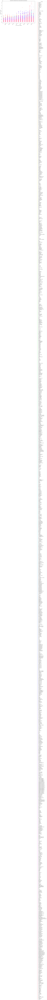

In [294]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


# 아파트명별로 색상을 다르게 하기 위해 카테고리 인코딩
unique_apartments = df['아파트명'].unique()
palette = sns.color_palette("hsv", len(unique_apartments))
color_dict = {name: palette[i] for i, name in enumerate(unique_apartments)}

# 각 아파트명에 색상 할당
df['color'] = df['아파트명'].map(color_dict)

# 산점도 그리기
plt.figure(figsize=(12, 8))

# 산점도 생성
for apt in unique_apartments:
    subset = df[df['아파트명'] == apt]
    plt.scatter(subset['계약년월'], subset['target'], label=apt, color=color_dict[apt], alpha=0.6, edgecolors='w', linewidth=0.5)

# 그래프 제목 및 레이블 설정
plt.title('Scatter Plot of Target Prices by Contract Month and Apartment')
plt.xlabel('Contract Month (계약년월)')
plt.ylabel('Target Price (target)')

# x축 레이블을 가독성 있게 회전
plt.xticks(rotation=45)

# 범례 추가
plt.legend(title='아파트명', bbox_to_anchor=(1.05, 1), loc='upper left')

# 그래프 출력
plt.show()


# 강남여부

In [297]:
# '구'가 '강남구'인지 확인하여 '강남여부' 열 생성
trainset_0715['강남여부'] = trainset_0715['구'] == '강남구'

# '강남여부' 열을 0과 1로 변환
trainset_0715['강남여부'] = trainset_0715['강남여부'].astype(int)

# 가격높은동 여부

In [298]:
trainset_0715['동'].unique()

array(['개포동', '논현동', '대치동', '도곡동', '삼성동', '세곡동', '수서동', '신사동', '역삼동',
       '압구정동', '일원동', '자곡동', '청담동', '강일동', '율현동', '고덕동', '길동', '둔촌동',
       '명일동', '상일동', '성내동', '암사동', '천호동', '미아동', '번동', '가양동', '수유동',
       '우이동', '내발산동', '등촌동', '공항동', '마곡동', '방화동', '염창동', '화곡동', '남현동',
       '봉천동', '신림동', '광장동', '구의동', '자양동', '군자동', '화양동', '개봉동', '고척동',
       '중곡동', '가리봉동', '구로동', '오류동', '천왕동', '독산동', '온수동', '궁동', '신도림동',
       '항동', '가산동', '시흥동', '공릉동', '상계동', '월계동', '중계동', '하계동', '도봉동',
       '방학동', '쌍문동', '창동', '답십리동', '용두동', '이문동', '신설동', '장안동', '전농동',
       '회기동', '제기동', '청량리동', '휘경동', '노량진동', '대방동', '동작동', '본동', '사당동',
       '상도동', '상도1동', '신대방동', '흑석동', '공덕동', '노고산동', '대흥동', '도화동', '마포동',
       '상수동', '상암동', '서교동', '성산동', '신공덕동', '신수동', '신정동', '아현동', '동교동',
       '망원동', '염리동', '용강동', '중동', '창전동', '하중동', '합정동', '남가좌동', '냉천동',
       '북가좌동', '연남동', '토정동', '현석동', '대현동', '연희동', '영천동', '충정로3가', '현저동',
       '홍은동', '홍제동', '북아현동', '창천동', '천연동', '충정로2가', '합동', '내곡동', '반포동',
       '방배

In [318]:
median_targets.head(40).동.unique()

array(['압구정동', '반포동', '한남동', '용산동5가', '서빙고동', '한강로3가', '도곡동', '잠원동',
       '이태원동', '대치동', '청담동', '여의도동', '삼성동', '홍파동', '평동', '신천동', '개포동',
       '회현동2가', '원효로1가', '청암동', '이촌동', '잠실동', '남대문로5가', '성수동1가', '하중동',
       '신계동', '내수동', '일원동', '신원동', '현석동', '내곡동', '방배동', '사직동', '방이동',
       '동자동', '옥수동', '상수동', '흑석동', '한강로1가', '세곡동'], dtype=object)

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

all_list = []
for seach_year in range(2017, 2023):

    # 각 '동'별 target의 중앙값 계산
    median_targets = trainset_0715[trainset_0715['계약년']==seach_year].groupby('동')['target'].median().reset_index()

    # target 값의 중앙값 기준으로 내림차순 정렬
    median_targets = median_targets.sort_values(by='target', ascending=False)

    pricy = median_targets.head(40).동.unique()
    
    all_list.append(pricy)
    
    # 산점도 그리기
    plt.figure(figsize=(30, 8))  # 그래프 크기를 늘려서 가독성 향상

    # 산점도 생성
    plt.scatter(median_targets['동'], median_targets['target'], c='blue', label='Median Target')

    # 그래프 제목 및 레이블 설정
    plt.title('Median Target Prices by District (Sorted by Target)', fontsize=15)
    plt.xlabel('District (동)', fontsize=12)
    plt.ylabel('Median Target Price', fontsize=12)
    plt.legend()

    # x축 레이블을 가독성 있게 회전 및 크기 조정
    plt.xticks(rotation=90, fontsize=10)

    # 그래프 출력
    plt.show()


In [320]:
all_list

[array(['장충동1가', '압구정동', '반포동', '용산동5가', '대치동', '회현동2가', '청암동', '도곡동',
        '서빙고동', '잠실동', '청담동', '삼성동', '한강로3가', '하중동', '잠원동', '주성동', '내수동',
        '동빙고동', '남대문로5가', '서초동', '역삼동', '신천동', '일원동', '방배동', '개포동', '사직동',
        '홍파동', '자곡동', '한남동', '회현동1가', '여의도동', '방이동', '교남동', '동자동', '이촌동',
        '한강로1가', '견지동', '신계동', '용강동', '논현동'], dtype=object),
 array(['압구정동', '반포동', '서빙고동', '주성동', '용산동5가', '대치동', '한남동', '잠원동', '삼성동',
        '잠실동', '도곡동', '청담동', '개포동', '한강로3가', '회현동2가', '청암동', '신천동', '홍파동',
        '신계동', '일원동', '하중동', '동빙고동', '방배동', '자곡동', '이촌동', '서초동', '남대문로5가',
        '동자동', '교남동', '여의도동', '신원동', '사직동', '내수동', '한강로1가', '회현동1가', '용강동',
        '원효로1가', '논현동', '내곡동', '상수동'], dtype=object),
 array(['압구정동', '반포동', '대치동', '서빙고동', '용산동5가', '청암동', '잠원동', '삼성동', '청담동',
        '도곡동', '개포동', '잠실동', '한강로3가', '하중동', '한남동', '신천동', '여의도동', '역삼동',
        '교남동', '홍파동', '내수동', '일원동', '서초동', '방이동', '이촌동', '회현동2가', '신계동',
        '평동', '용강동', '남대문로5가', '방배동', '자곡동', '사직동', '만리동2가', '보광동', 

In [321]:
# 모든 배열을 하나의 배열로 병합
merged_array = np.concatenate(all_list)

# 유일한 값만 추출
unique_values = np.unique(merged_array)

print(unique_values)

['개포동' '견지동' '교남동' '남대문로5가' '내곡동' '내수동' '논현동' '대치동' '도곡동' '동빙고동' '동자동'
 '만리동2가' '반포동' '방배동' '방이동' '보광동' '사직동' '삼성동' '상수동' '서교동' '서빙고동' '서초동'
 '성수동1가' '세곡동' '신계동' '신문로2가' '신원동' '신천동' '아현동' '압구정동' '여의도동' '역삼동' '옥수동'
 '용강동' '용산동5가' '원효로1가' '이촌동' '이태원동' '일원동' '자곡동' '잠실동' '잠원동' '장충동1가' '주성동'
 '청담동' '청암동' '평동' '하중동' '한강로1가' '한강로3가' '한남동' '현석동' '홍파동' '회현동1가' '회현동2가'
 '흑석동']


In [322]:
# '동'이 unique_values에 있는지 확인하여 '가격높은동' 열 생성
trainset_0715['가격높은동'] = trainset_0715['동'].apply(lambda x: 1 if x in unique_values else 0)


In [323]:
trainset_0715.to_csv(r'/data/ephemeral/home/yjl/upstage-ml-regression-ml5/data_final/trainset_0715.csv')

# 재건축 살펴보기

In [7]:
trainset_0715 = pd.read_csv(r'/data/ephemeral/home/yjl/upstage-ml-regression-ml5/data_final/trainset_0715.csv')

/tmp/ipykernel_507167/4215059825.py:1: DtypeWarning: Columns (79) have mixed types. Specify dtype option on import or set low_memory=False.
  trainset_0715 = pd.read_csv(r'/data/ephemeral/home/yjl/upstage-ml-regression-ml5/data_final/trainset_0715.csv')


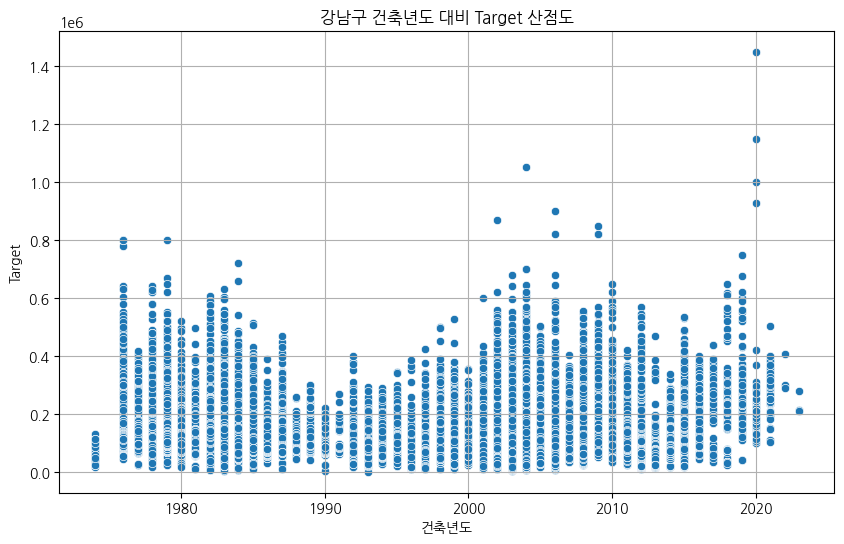

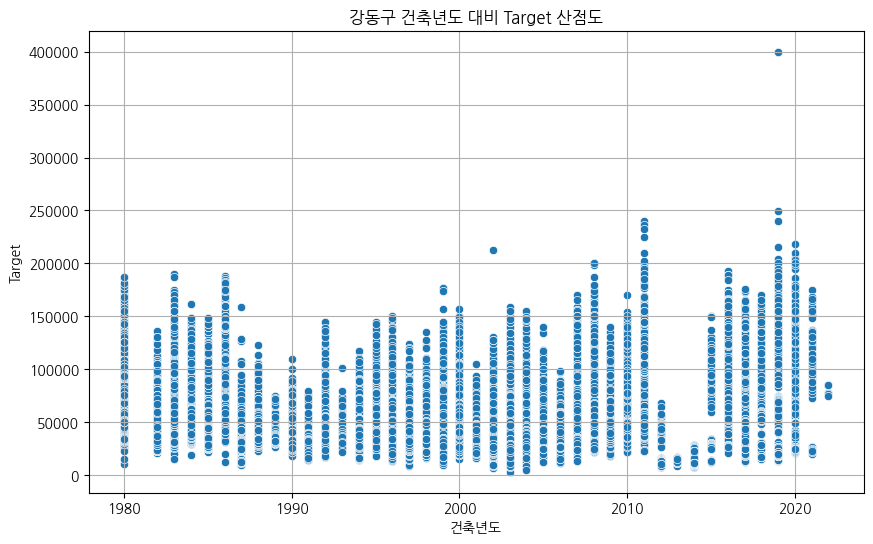

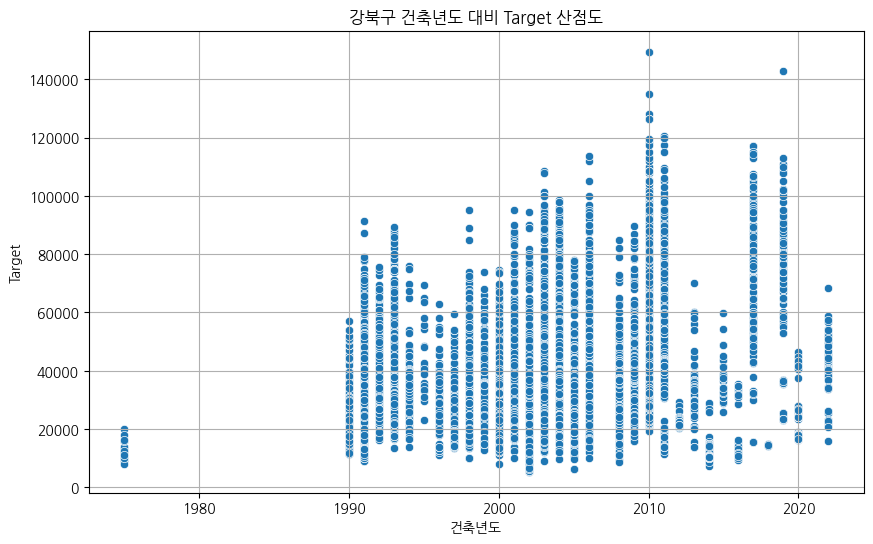

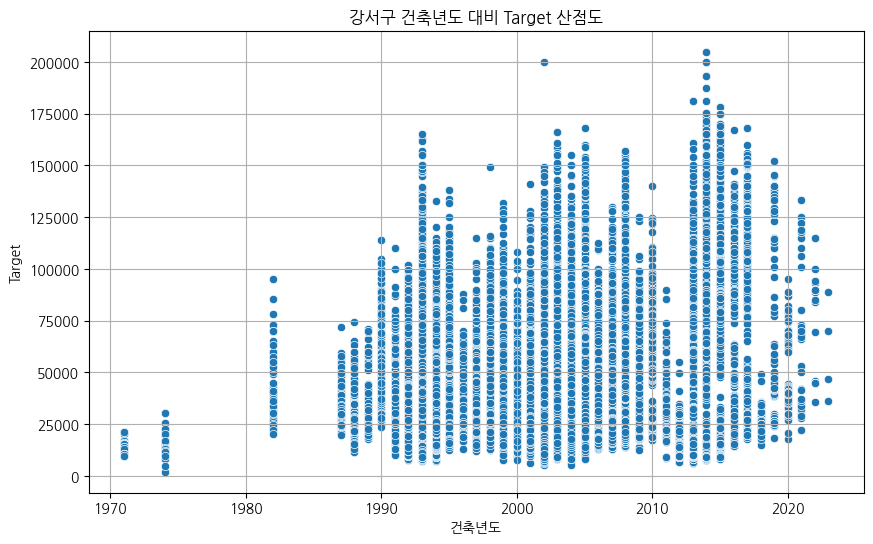

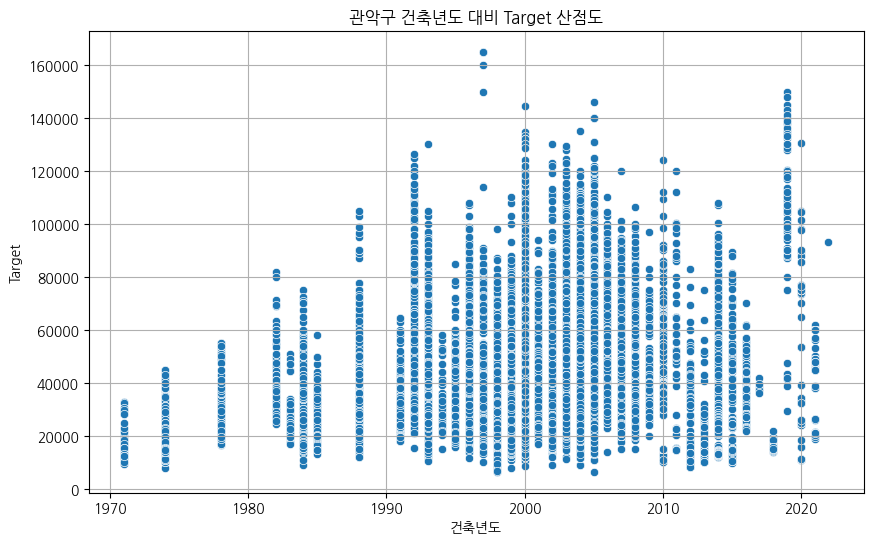

...

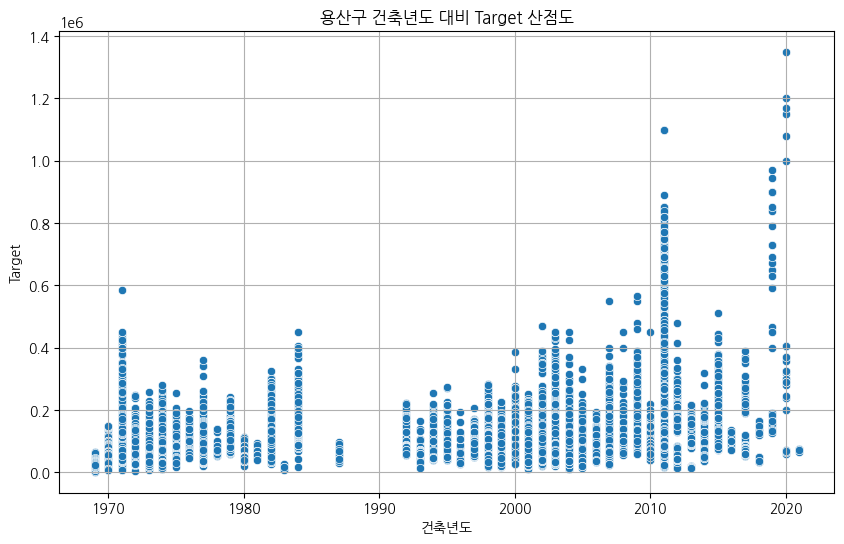

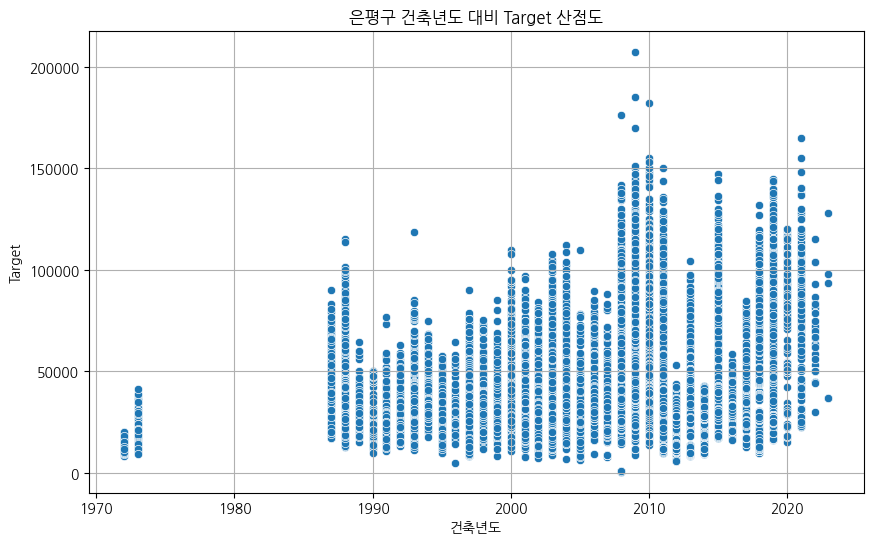

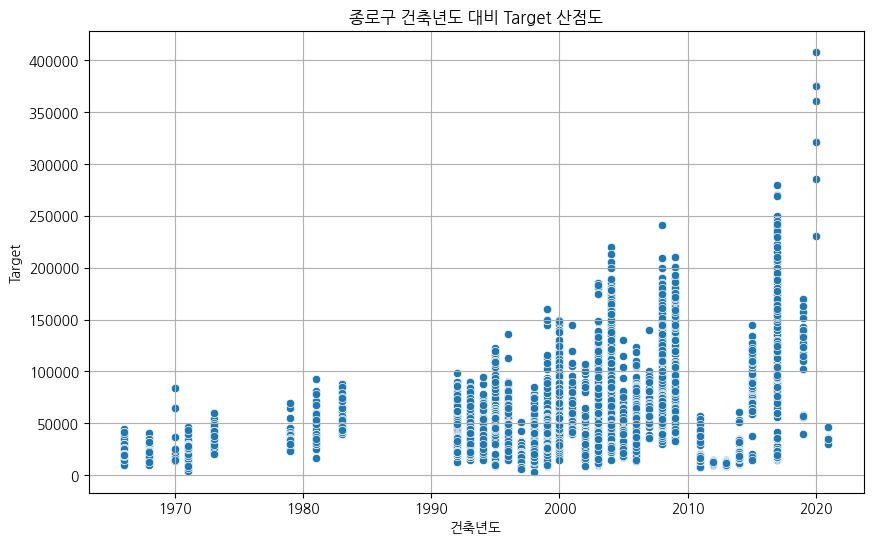

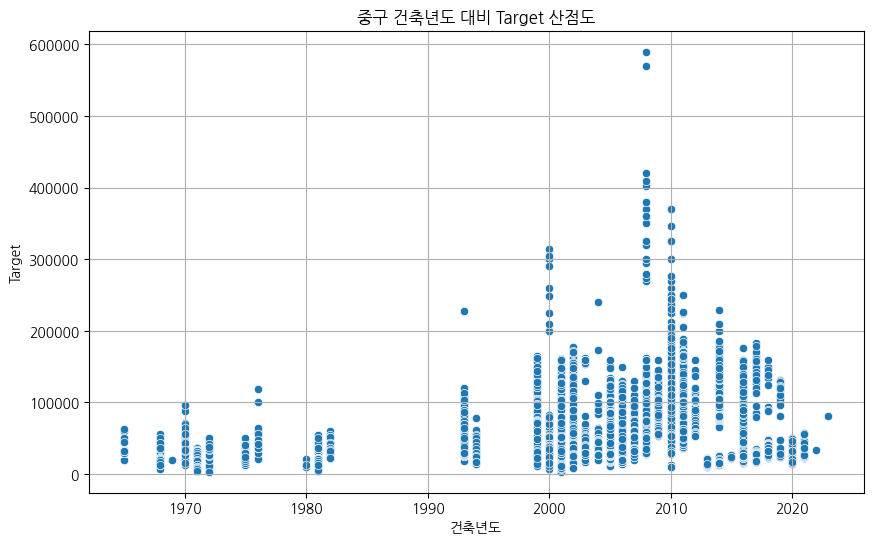

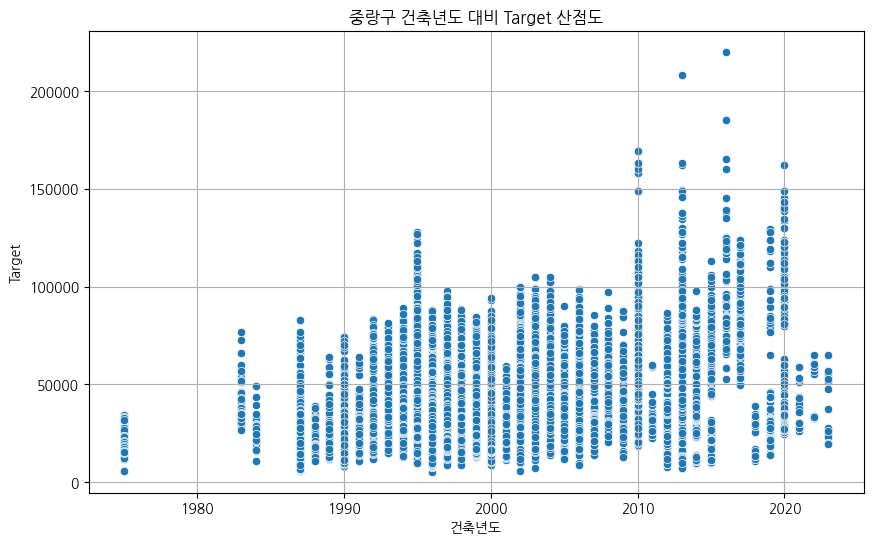

In [14]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 필요한 컬럼만 선택
df = trainset_0715[['건축년도', 'target', '구']]
gus = ['강남구', '강동구', '강북구', '강서구', '관악구', '광진구', '구로구', '금천구', '노원구', '도봉구', '동대문구', '동작구', '마포구', '서대문구', '서초구', '성동구', '성북구', '송파구', '양천구', '영등포구', '용산구', '은평구', '종로구', '중구', '중랑구']

for gu in gus:
    gu_data = df[df['구'] == gu]  # 구별 데이터 필터링
    if not gu_data.empty:  # 데이터가 있는 경우에만 그래프 그리기
        plt.figure(figsize=(10, 6))  # 그래프 크기 설정
        sns.scatterplot(x='건축년도', y='target', data=gu_data)  # seaborn을 사용한 산점도
        plt.title(f'{gu} 건축년도 대비 Target 산점도')  # 그래프 제목 설정
        plt.xlabel('건축년도')  # X축 라벨
        plt.ylabel('Target')  # Y축 라벨
        plt.grid(True)  # 그리드 추가
        plt.show()


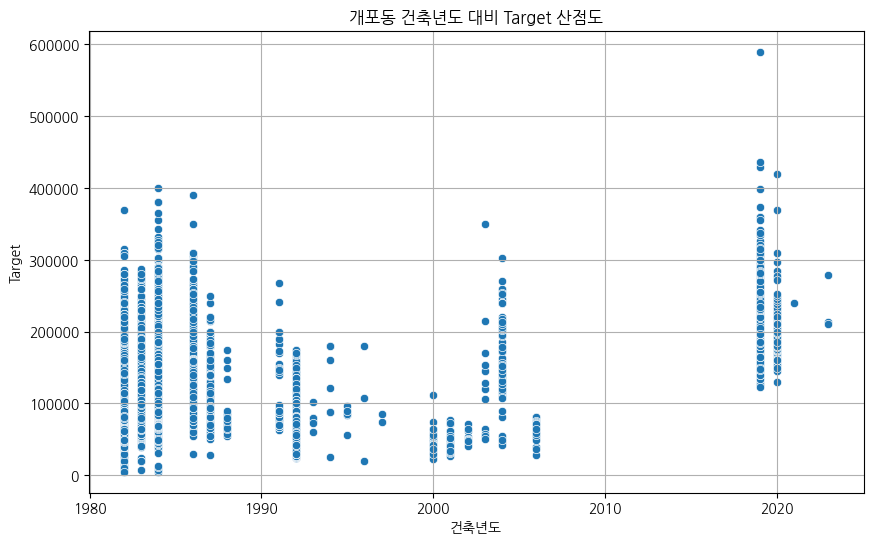

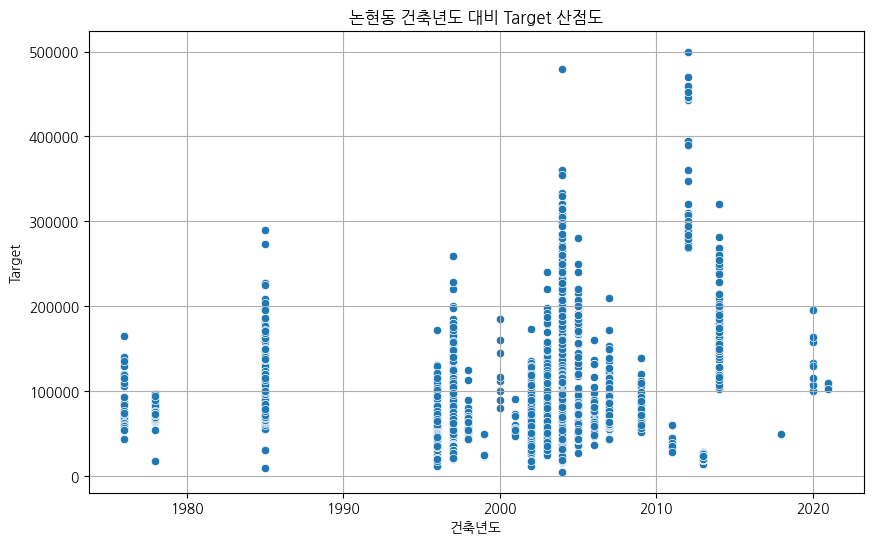

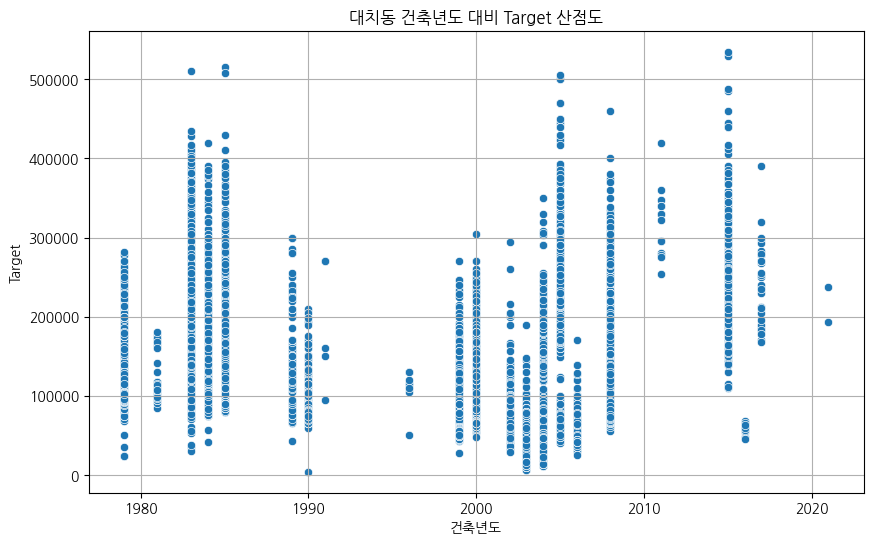

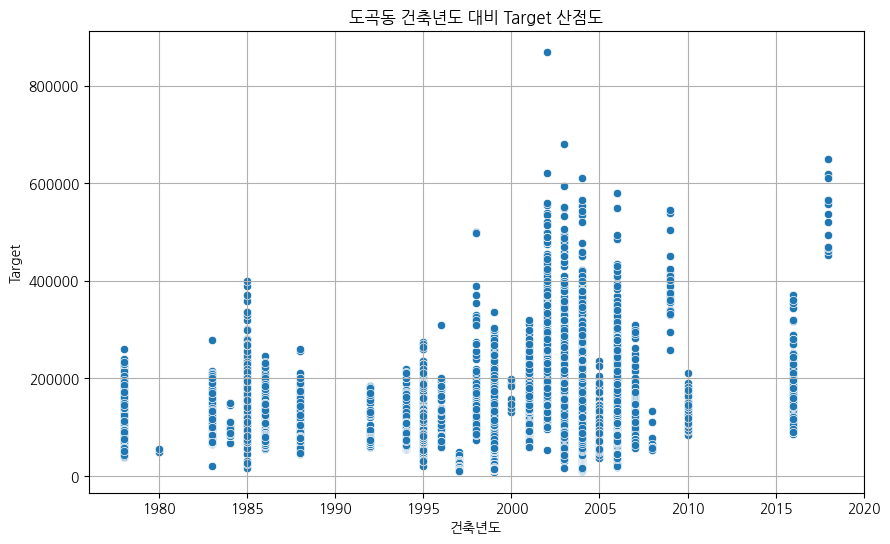

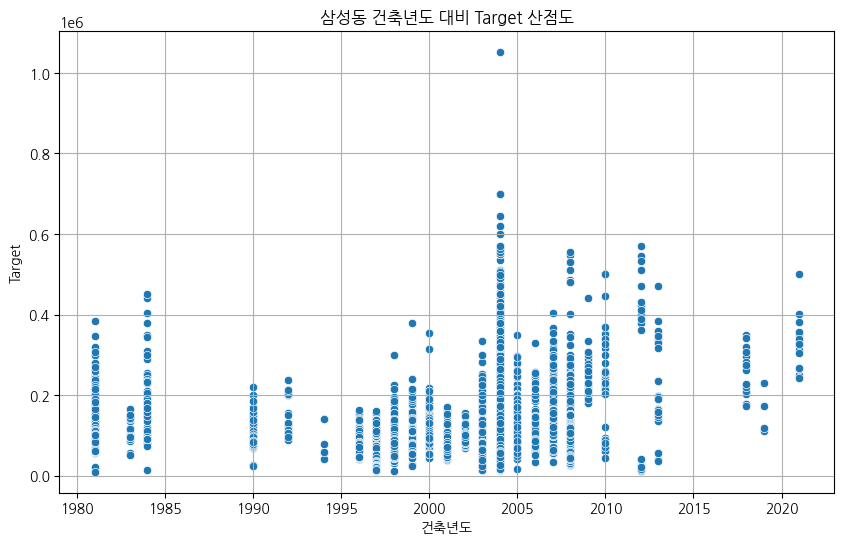

...

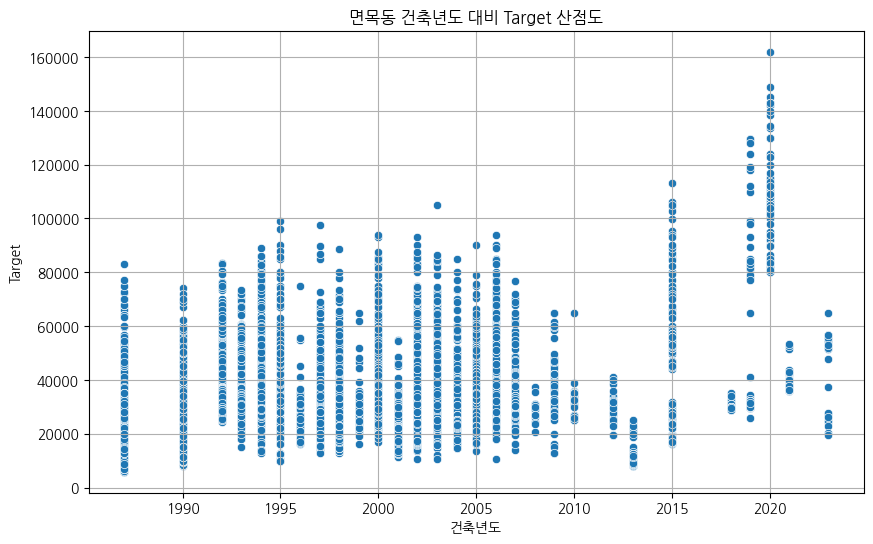

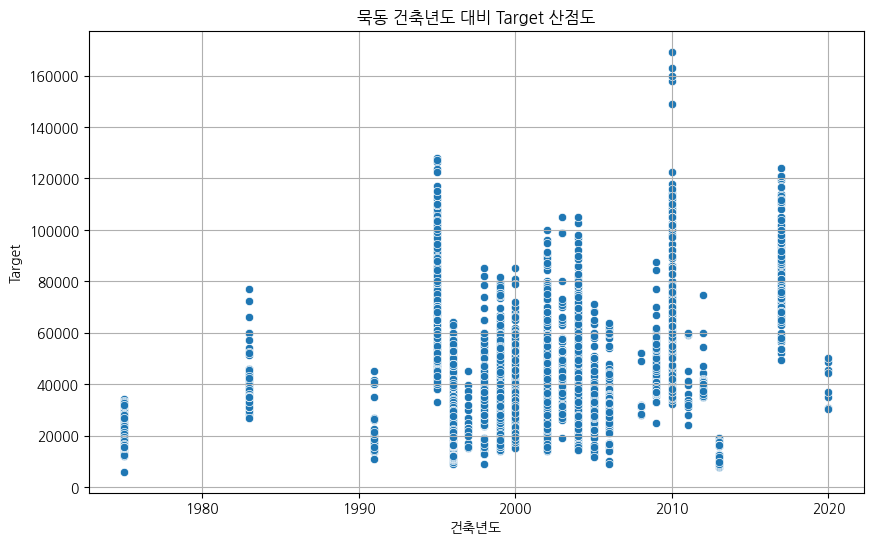

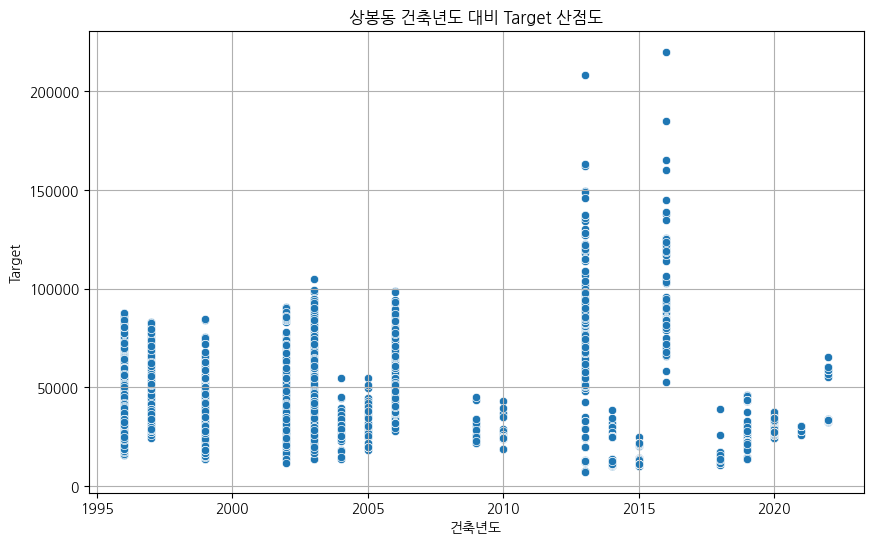

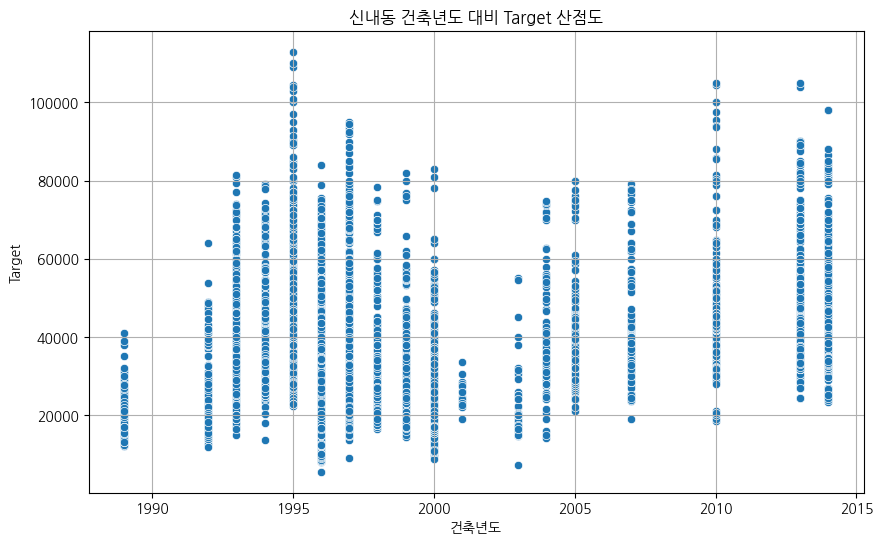

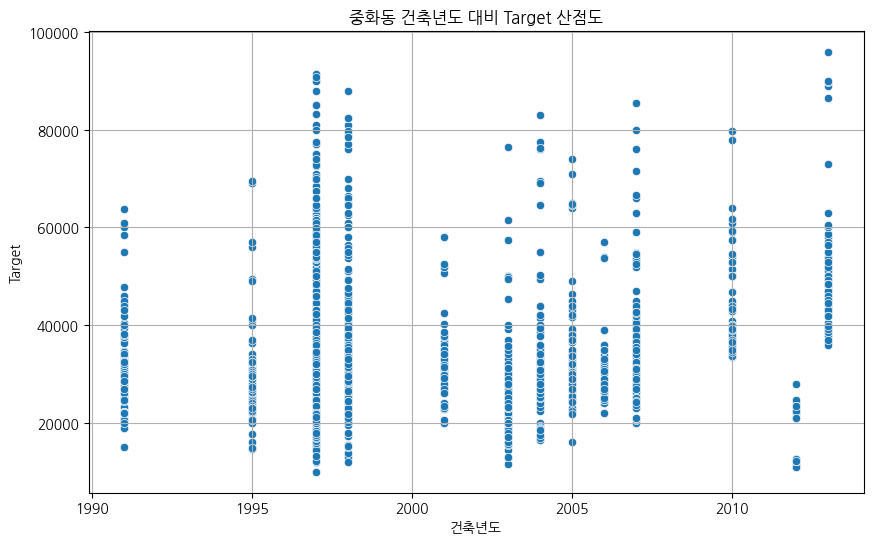

In [16]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 필요한 컬럼만 선택
df = trainset_0715[['건축년도', 'target', '구','동']]
dongs = {
    '강남구': ['개포동', '논현동', '대치동', '도곡동', '삼성동', '세곡동', '수서동', '신사동', '압구정동', '역삼동', '일원동', '청담동'],
    '강동구': ['강일동', '고덕동', '길동', '둔촌동', '명일동', '상일동', '성내동', '암사동', '천호동'],
    '강북구': ['미아동', '번동', '수유동', '우이동'],
    '강서구': ['가양동', '공항동', '등촌동', '방화동', '염창동', '화곡동'],
    '관악구': ['남현동', '봉천동', '신림동'],
    '광진구': ['군자동', '구의동', '자양동', '중곡동'],
    '구로구': ['고척동', '구로동', '신도림동', '오류동', '천왕동'],
    '금천구': ['가산동', '독산동', '시흥동'],
    '노원구': ['공릉동', '상계동', '월계동', '중계동', '하계동'],
    '도봉구': ['도봉동', '방학동', '쌍문동', '창동'],
    '동대문구': ['답십리동', '신설동', '용두동', '이문동', '장안동', '청량리동', '회기동'],
    '동작구': ['노량진동', '대방동', '동작동', '상도동', '신대방동'],
    '마포구': ['공덕동', '대흥동', '도화동', '마포동', '상암동', '서교동', '성산동', '염리동', '합정동'],
    '서대문구': ['남가좌동', '냉천동', '대현동', '북가좌동', '신촌동', '연희동'],
    '서초구': ['내곡동', '반포동', '방배동', '서초동', '양재동', '우면동'],
    '성동구': ['금호동', '도선동', '마장동', '사근동', '성수동', '옥수동'],
    '성북구': ['길음동', '돈암동', '보문동', '성북동', '정릉동', '종암동'],
    '송파구': ['가락동', '거여동', '마천동', '방이동', '석촌동', '송파동', '오금동', '잠실동'],
    '양천구': ['목동', '신월동', '신정동'],
    '영등포구': ['대림동', '도림동', '신길동', '양평동', '여의도동', '영등포동'],
    '용산구': ['동빙고동', '서빙고동', '용문동', '이촌동', '한강로동', '효창동', '후암동'],
    '은평구': ['녹번동', '대조동', '불광동', '수색동', '신사동', '역촌동', '응암동'],
    '종로구': ['가회동', '계동', '삼청동', '세종로', '숭인동', '이화동', '종로1.2.3.4가동', '창신동', '청운효자동', '평창동', '혜화동'],
    '중구': ['다동', '동화동', '명동', '소공동', '신당동', '장충동', '중림동', '청구동'],
    '중랑구': ['망우동', '면목동', '묵동', '상봉동', '신내동', '중화동']
}

for gu, dongs_list in dongs.items():

    for dong in dongs_list:
        
        dongdata = df[(df['구'] == gu)&(df['동'] == dong)]  # 구별 데이터 필터링
        if not dongdata.empty:  # 데이터가 있는 경우에만 그래프 그리기
            plt.figure(figsize=(10, 6))  # 그래프 크기 설정
            sns.scatterplot(x='건축년도', y='target', data=dongdata)  # seaborn을 사용한 산점도
            plt.title(f'{dong} 건축년도 대비 Target 산점도')  # 그래프 제목 설정
            plt.xlabel('건축년도')  # X축 라벨
            plt.ylabel('Target')  # Y축 라벨
            plt.grid(True)  # 그리드 추가
            plt.show()


# 동별로 건축년도별 median 값을 만든다
# 그 값이 일반적인 선형회귀선과 맞지 않게 이상치이면 재건축 영향으로 값이 비쌀 것이다.
 

In [51]:
df = trainset_0715[(trainset_0715['is_test']==0)].copy()

In [52]:
import pandas as pd
import numpy as np
from sklearn.linear_model import LinearRegression


# 동별로 건축년도에 따른 target의 median 값 계산
median_df = df.groupby(['동', '전용면적(㎡)', '건축년도'])['target'].median().reset_index()

# 새로운 컬럼 생성
df['재건축'] = 0

# 선형 회귀 모델 생성 및 이상치 탐지
for idx, row in df.iterrows():
    dong = row['동']
    area = row['전용면적(㎡)']
    construction_year = row['건축년도']
    
    dong_data = median_df[(median_df['동'] == dong)&(median_df['전용면적(㎡)'] == area)]
    
    # 선형 회귀 모델 생성
    X = dong_data['건축년도'].values.reshape(-1, 1)
    y = dong_data['target'].values
    model = LinearRegression()
    model.fit(X, y)
    
    # 예측 값 계산
    pred = model.predict(np.array([[construction_year]]))[0]
    
    # 잔차 계산 (실제 값과 예측 값의 차이)
    residual = abs(row['target'] - pred)
    
    # 잔차의 기준 (여기서는 잔차가 중앙값의 1.5배 이상이면 이상치로 간주)
    threshold = 1.5 * np.median(abs(dong_data['target'] - model.predict(X)))
    
    # 이상치 탐지
    if residual > threshold:
        df.at[idx, '재건축'] = 1
#51분걸림


In [58]:
df.to_csv(r'/data/ephemeral/home/yjl/upstage-ml-regression-ml5/data_final/trainset_0715_재건축.csv')

In [ ]:
#재건축이 1인 경우 건축년도별 target값을 그래프로 확인한다

In [56]:
filtered = df[df['재건축']==1][['건축년도','전용면적(㎡)','target','아파트명','도로명주소']]

In [61]:
filtered_재건축 = filtered[['아파트명','도로명주소']].drop_duplicates()

In [62]:
filtered_재건축.to_csv(r'/data/ephemeral/home/yjl/upstage-ml-regression-ml5/data/filtered_재건축.csv')

In [64]:
trainset_0715_재건축 = df.copy()

In [65]:
# 재건축예상 컬럼 추가 및 초기화
trainset_0715_재건축['재건축예상'] = 0

# 재건축예상 컬럼 값 설정
for idx, row in trainset_0715_재건축.iterrows():
    if ((filtered_재건축['아파트명'] == row['아파트명']) & 
        (filtered_재건축['도로명주소'] == row['도로명주소'])).any():
        trainset_0715_재건축.at[idx, '재건축예상'] = 1
# 20분

In [66]:
trainset_0715_재건축.to_csv(r'/data/ephemeral/home/yjl/upstage-ml-regression-ml5/data_final/trainset_0715_재건축.csv')

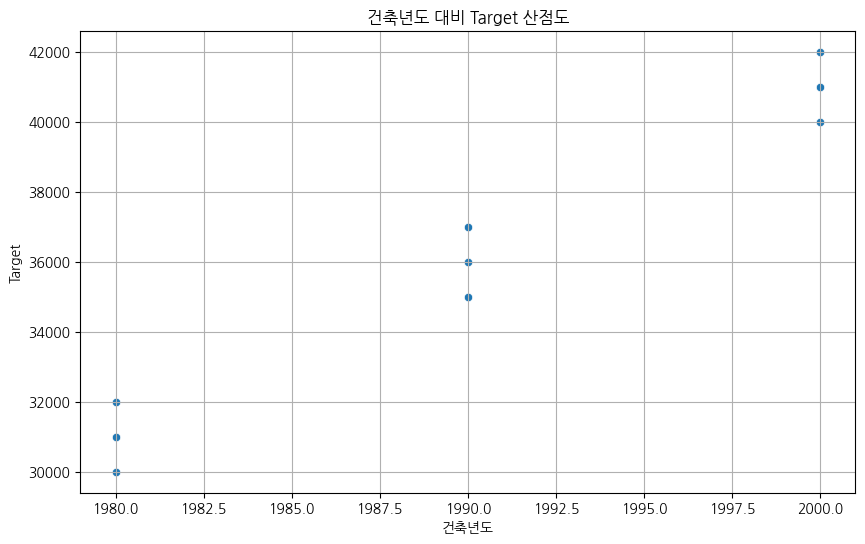

In [20]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


plt.figure(figsize=(10, 6))  # 그래프 크기 설정
sns.scatterplot(x='건축년도', y='target', data=median_df)  # seaborn을 사용한 산점도
plt.title('건축년도 대비 Target 산점도')  # 그래프 제목 설정
plt.xlabel('건축년도')  # X축 라벨
plt.ylabel('Target')  # Y축 라벨
plt.grid(True)  # 그리드 추가
plt.show()


# 미분양 feature engineering

이동 평균 계산: 각 구별로 미분양 데이터의 3개월 이동 평균을 계산합니다.
전년 대비 변화율 계산: 각 구별로 미분양 데이터의 전년 대비 변화율을 계산합니다.

In [95]:
df = trainset_0715_재건축.copy()

In [115]:
# '계약년월'을 기준으로 정렬
df = df.sort_values(by='계약년월')

# 구별 미분양 데이터의 이동 평균 계산 (예: 3개월 이동 평균)
df['미분양_이동평균'] = df.groupby('구')['미분양_구'].transform(lambda x: x.rolling(window=3, min_periods=1).mean())

# 구별 미분양 데이터의 3개월 전 대비 변화율 계산
df['미분양_3개월대비'] = df.groupby('구')['미분양_구'].transform(lambda x: x.pct_change(periods=3)).fillna(0)

/tmp/ipykernel_507167/3920626480.py:8: FutureWarning: The default fill_method='pad' in Series.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.
  df['미분양_3개월대비'] = df.groupby('구')['미분양_구'].transform(lambda x: x.pct_change(periods=3)).fillna(0)


In [124]:
강동구미분양전년대비 = df[df['구']=='동작구'][['계약년월','미분양_전년대비','미분양_이동평균']]

In [125]:
강동구미분양전년대비2 = 강동구미분양전년대비.drop_duplicates()

In [126]:
강동구미분양전년대비2

,계약년월,미분양_전년대비,미분양_이동평균
1118634,200701,0.0,0.0
1101132,200702,0.0,0.0
1101044,200703,0.0,0.0
1118650,200704,0.0,0.0
1101353,200705,0.0,0.0
...,...,...,...
211838,202302,0.0,0.0
211877,202303,0.0,0.0
211559,202304,0.0,0.0
214766,202305,0.0,0.0


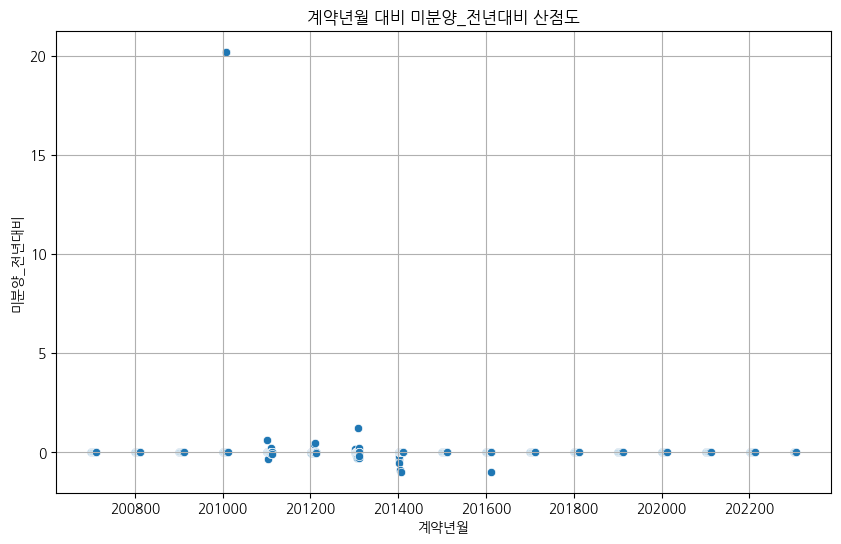

In [127]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


plt.figure(figsize=(10,6))  # 그래프 크기 설정
sns.scatterplot(x='계약년월', y='미분양_전년대비', data=강동구미분양전년대비2)  # seaborn을 사용한 산점도
plt.title('계약년월 대비 미분양_전년대비 산점도')  # 그래프 제목 설정
plt.xlabel('계약년월')  # X축 라벨
plt.ylabel('미분양_전년대비')  # Y축 라벨
plt.grid(True)  # 그리드 추가
plt.show()

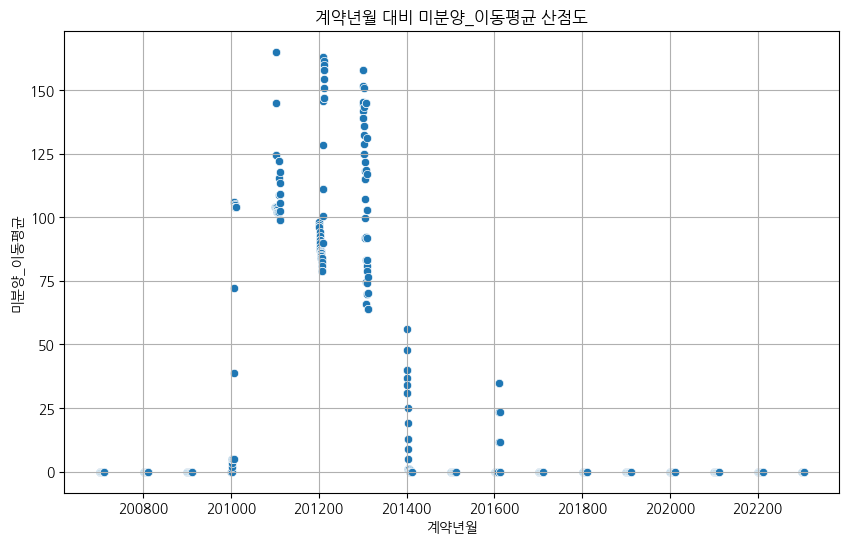

In [128]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


plt.figure(figsize=(10,6))  # 그래프 크기 설정
sns.scatterplot(x='계약년월', y='미분양_이동평균', data=강동구미분양전년대비2)  # seaborn을 사용한 산점도
plt.title('계약년월 대비 미분양_이동평균 산점도')  # 그래프 제목 설정
plt.xlabel('계약년월')  # X축 라벨
plt.ylabel('미분양_이동평균')  # Y축 라벨
plt.grid(True)  # 그리드 추가
plt.show()

In [130]:
df.columns

Index(['Unnamed: 0', '시군구', '번지', '본번', '부번', '아파트명', '전용면적(㎡)', '계약년월', '계약일',
       '층',
       ...
       'brand', 'lower_outliers', 'upper_outliers', '강남여부', '가격높은동', '재건축',
       '재건축예상', '미분양_이동평균', '미분양_전년대비', '미분양_3개월대비'],
      dtype='object', length=128)

In [132]:
df.drop(columns=['Unnamed: 0','미분양_전년대비'], inplace=True)

In [134]:
df.to_csv(r'/data/ephemeral/home/yjl/upstage-ml-regression-ml5/data_final/trainset_0716.csv')

In [135]:
trainset_0716 = df.copy()

In [133]:
df.head(5)

,시군구,번지,본번,부번,아파트명,전용면적(㎡),계약년월,계약일,층,건축년도,...,모든학원수,brand,lower_outliers,upper_outliers,강남여부,가격높은동,재건축,재건축예상,미분양_이동평균,미분양_3개월대비
1118821,서울특별시 중구 묵정동,11-67,11.0,67.0,묵정,52.46,200701,10,5,1981,...,16.0,0,1,1,0,0,1,1,0.0,0.0
1079552,서울특별시 강동구 둔촌동,603,603.0,0.0,프라자,109.07,200701,24,12,1984,...,0.0,0,1,1,0,0,1,1,0.0,0.0
1079315,서울특별시 강동구 길동,456-2,456.0,2.0,하이브,59.97,200701,1,8,2006,...,73.0,0,0,0,0,0,1,1,0.0,0.0
1079316,서울특별시 강동구 길동,456-2,456.0,2.0,하이브,62.64,200701,6,13,2006,...,73.0,0,0,0,0,0,1,1,0.0,0.0
1079317,서울특별시 강동구 길동,456-2,456.0,2.0,하이브,59.97,200701,21,5,2006,...,73.0,0,0,0,0,0,1,1,0.0,0.0


# 번지주소 도로명 결측치 채우기

In [136]:
addr_up_ej = pd.read_csv(r'/data/ephemeral/home/yjl/upstage-ml-regression-ml5/data/addr_up_ej.csv')

In [138]:
addr_up_ej.drop_duplicates(inplace=True)

In [141]:
addr_up_ej.columns=['번지주소_ej','도로명_ej']

In [143]:
addr_up_ej.to_csv(r'/data/ephemeral/home/yjl/upstage-ml-regression-ml5/data/addr_up_ej.csv')

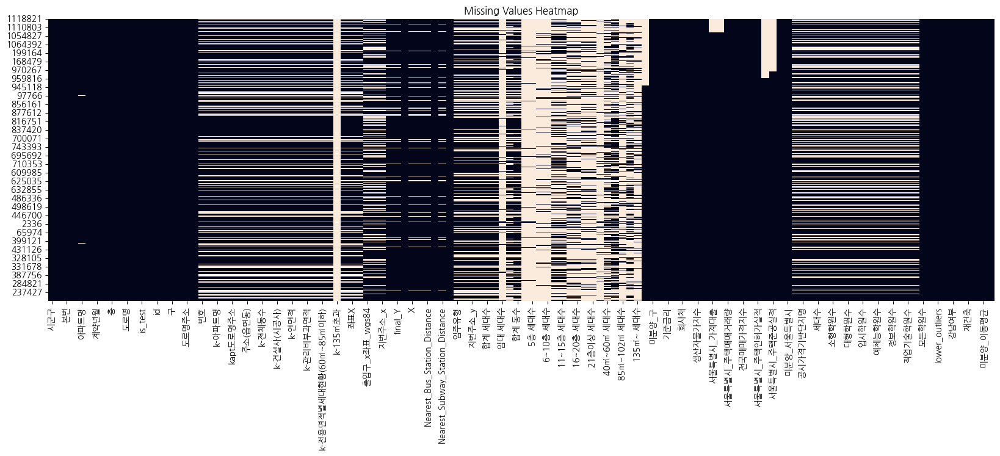

In [140]:
import seaborn as sns
import matplotlib.pyplot as plt

# 결측치 히트맵 생성
plt.figure(figsize=(20, 6))  # 가로 16인치, 세로 6인치로 설정
sns.heatmap(trainset_0716.isnull(), cbar=False)
plt.title("Missing Values Heatmap")
plt.show()

In [145]:
df = pd.merge(trainset_0716, addr_up_ej, left_on='도로명주소', right_on='도로명_ej', how='left')

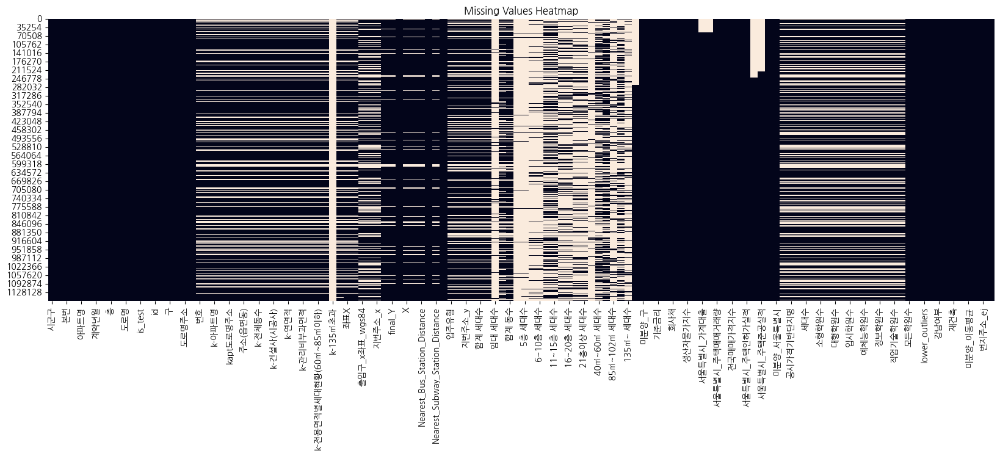

In [147]:
import seaborn as sns
import matplotlib.pyplot as plt

# 결측치 히트맵 생성
plt.figure(figsize=(20, 6))  # 가로 16인치, 세로 6인치로 설정
sns.heatmap(df.isnull(), cbar=False)
plt.title("Missing Values Heatmap")
plt.show()

In [148]:
df.to_csv(r'/data/ephemeral/home/yjl/upstage-ml-regression-ml5/data_final/trainset_0716.csv')

In [149]:
trainset_0716 = df.copy()